## Installing relevant packages

In [123]:
install.packages("rnaturalearthdata")

Installing package into ‘/home/giovannelli/R/x86_64-pc-linux-gnu-library/4.3’
(as ‘lib’ is unspecified)



## Loading relevant libraries

In [1]:
library(dada2) # sequence processing package
library(phyloseq) # microbial diversity package
library(ggplot2) # plotting package
library(viridis) # viridis palette
library(vegan) # ecology package
library(factoextra) # statistical package
library(ggpubr) # publication ready figure manipulation
library(ggrepel) # label repel
library(microbiome) # microbiome analysis focused package
library(ggplotify) # ggplot add on package for plotting
library(rnaturalearth) # Maps and georeference data and package to work with sf lirbary
library(sf) # Map and georeferenced map plotting
library(ggspatial) # spatial data analysis
library(marmap) # Bathymetry mapping 
library(scico) # Colors for scientific plotting including broc plaette
library(ggplotify)
library(ggdendro)
library(geosphere)
library(plotly)
library(ggnewscale)
library(tidyverse)

# library(ggtern) # not loaded since in my system creates conflicst. Used as ggtern::

Loading required package: Rcpp

Loading required package: viridisLite

Loading required package: permute

Loading required package: lattice


Attaching package: ‘lattice’


The following object is masked _by_ ‘.GlobalEnv’:

    environmental


This is vegan 2.6-4

Welcome! Want to learn more? See two factoextra-related books at https://goo.gl/ve3WBa


microbiome R package (microbiome.github.com)
    


 Copyright (C) 2011-2022 Leo Lahti, 
    Sudarshan Shetty et al. <microbiome.github.io>



Attaching package: ‘microbiome’


The following object is masked from ‘package:vegan’:

    diversity


The following object is masked from ‘package:ggplot2’:

    alpha


The following object is masked from ‘package:base’:

    transform


Linking to GEOS 3.10.2, GDAL 3.4.1, PROJ 8.2.1; sf_use_s2() is TRUE

Registered S3 methods overwritten by 'adehabitatMA':
  method                       from
  print.SpatialPixelsDataFrame sp  
  print.SpatialPixels          sp  


Attaching package: ‘marmap’




In [2]:
ls()

[1] "abund_geo"              "aggdata_phy"            "bat"                   
 [4] "cations_plot"           "clust"                  "clust.df"              
 [7] "coast_sf"               "code"                   "col_pH"                
[10] "col_rc_ra"              "col_temp"               "coord"                 
[13] "coords"                 "countries_sf"           "d.geo"                 
[16] "database"               "dendr"                  "dendr_for_barplot"     
[19] "df_p_val"               "df_var"                 "dist.bray"             
[22] "dist.geo"               "dna"                    "env_environment"       
[25] "env_fitting"            "env_fitting_crust"      "env_fitting_maj"       
[28] "env_fitting_min"        "env_geochemic_major"    "env_geochemic_trace"   
[31] "env_geophisic"          "environmental"          "fig"                   
[34] "figure3_list"           "geo"                    "groups"                
[37] "hc_bray"                "hclust_filt"            "legend_bar"            
[40] "list"                   "mainplot"               "Others_norm"           
[43] "otu_table"              "p"                      "p_cor"                 
[46] "p_richness"             "pc"                     "pH"                    
[49] "phy_norm"               "phy_norm_prune_proteoB" "phy_proteo"            
[52] "phy_tab"                "points_sf"              "prok_data"             
[55] "prok_data_clean"        "prok_data_cr"           "prok_hell_jsd"         
[58] "prok_hell_nmds"         "prok_hell_pcoa"         "prok_hell_rda"         
[61] "prok_ndata"             "prok_nmds_uw"           "prok_nmds_w"           
[64] "prok_nmds_w_3d"         "prok.hell"              "Proteo_Class"          
[67] "ps"                     "ps_class_rel"           "ps_filt"               
[70] "ps_j_un"                "ps_j_w"                 "ps_noECM"              
[73] "ps_norm_phylum_prune"   "ps_norm_rel"            "ps_phylum_rel"         
[76] "ps_proteo"              "ps_proteo_class"        "pssd2veg"              
[79] "rc_ra"                  "res.aov"                "sample_alpha"          
[82] "sample_norm"            "shannon"                "shape"                 
[85] "tas"                    "tax_table"              "Temp"                  
[88] "test"                   "test2"                  "theme_glab"

## Set up the figure theme

In [3]:
theme_glab <- function(base_size = 11,
                    base_family = "",
                    base_line_size = base_size / 180,
                    base_rect_size = base_size / 180) {
   
    font <- "Helvetica" #assign font family up front
   
    theme_bw(base_size = base_size,
                base_family = base_family,
                base_line_size = base_line_size) %+replace%
    theme(
        legend.background =  element_blank(),
        legend.title =       element_text(color = rgb(100, 100, 100, maxColorValue = 255),
                                          size = rel(0.65),
                                         hjust = 0),
        legend.text =        element_text(color = rgb(100, 100, 100, maxColorValue = 255),
                                          size = rel(0.65)),
        legend.key.size =    unit(0.8, "lines"),
     
      plot.title = element_text(
        color = rgb(100, 100, 100, maxColorValue = 255),
        hjust = 0),
       
      axis.title = element_text(
        color = rgb(100, 100, 100, maxColorValue = 255),
        size = rel(0.65)),
      axis.text = element_text(
        color = rgb(100, 100, 100, maxColorValue = 255),
        size = rel(0.65)),
       
      plot.caption = element_text(
        color = rgb(100, 100, 100, maxColorValue = 255),
        size = rel(0.35),
        hjust = 1),
       
      panel.grid.major = element_blank(),  
      panel.grid.minor = element_blank(),  
      panel.border = element_rect(fill = NA, colour = rgb(100, 100, 100, maxColorValue = 255)),

     
      complete = TRUE
    )
}

In [4]:
options(repr.plot.width=12, repr.plot.height=6)

## Importing data

In [7]:
### Microbial diversity
# load otu table from DADA2
otu_table <- read.table("ASV_tab_merg.csv", sep = ",", header = TRUE)
row.names(otu_table) <- as.character(unlist(otu_table[,1]))
otu_table = otu_table[,-1 ]

# load taxa table
tax_table <- read.table("taxa_merg.csv", sep = ",", header = TRUE)
row.names(tax_table) <- as.character(unlist(row.names(otu_table)))
tax_table= tax_table[,-1]
tax_table = as.matrix(tax_table)

# load metadata table
database <- read.csv("SampleData_merg.csv", sep = ",")
row.names(database)= database[,5]

In [8]:
### Other data and derived data fro maps
# laod the sample table
coord <- read.csv("coordinate.csv")

In [9]:
# Create data frame of only longitude and latitude values
coords <- select(coord, longitude, latitude)

In [10]:
# Create sf object with geo_data data frame and CRS
points_sf <- st_as_sf(coord, coords = c("longitude", "latitude"), crs = 4326, agr = "Altitude")

# Create sf object with coast and country data
coast_sf <- ne_coastline(scale = "medium", returnclass = "sf")
countries_sf <- ne_countries(scale = "medium", returnclass = "sf")

## Dada2 sequence processing and taxonomic annotation

In [ ]:
library(dada2); packageVersion("dada2")

path <- "~/marco/merging/BMS_16S_fastq/16S_BMS_LLO/tot_database/"
fnFs <- sort(list.files(path, pattern="_R1_001.fastq.gz", full.names = TRUE))
fnRs <- sort(list.files(path, pattern="_R2_001.fastq.gz", full.names = TRUE))
sample.names <- sapply(strsplit(basename(fnFs), "_L00"), `[`, 1)
 
filtFs <- file.path(path, "filtered", paste0(sample.names, "_F_filt.fastq.gz"))
filtRs <- file.path(path, "filtered", paste0(sample.names, "_R_filt.fastq.gz"))

names(filtFs) <- sample.names
names(filtRs) <- sample.names

out <- filterAndTrim(fnFs, filtFs, fnRs, filtRs, truncLen=c(245,200),
            maxN=0, maxEE=c(2,2), truncQ=2, rm.phix=TRUE, trimLeft=23,
            compress=TRUE, multithread=FALSE)
    head(out)


names(filtFs) <- sample.names
names(filtRs) <- sample.names
set.seed(100)
# Set the seed of R‘s random number generator, which is useful for creating simulations or random 
# objects that can be reproduced.

mergers_quar <- vector("list", length(sample.names))
names(mergers_quar) <- sample.names
for(sam in sample.names) {
  cat("Processing:", sam, "\n")
    errF_quar <- learnErrors(filtFs[[sam]], nbases=1e8, multithread=TRUE)
    derepF_quar <- derepFastq(filtFs[[sam]])
    ddF_quar <- dada(derepF_quar, err=errF_quar, multithread=TRUE)
    errR_quar <- learnErrors(filtRs[[sam]], nbases=1e8, multithread=TRUE)
    derepR_quar <- derepFastq(filtRs[[sam]])
    ddR_quar <- dada(derepR_quar, err=errR_quar, multithread=TRUE)
    merger_quar <- mergePairs(ddF_quar, derepF_quar, ddR_quar, derepR_quar)
    mergers_quar[[sam]] <- merger_quar
}

rm(derepF_quar); rm(derepR_quar); rm(ddR_quar); rm(ddF_quar); rm(errF_quar); rm(errR_quar) 

seqtab_quar <- makeSequenceTable(mergers_quar)
    
table(nchar(getSequences(seqtab_quar)))
seqtab_quar <- seqtab_quar[,nchar(colnames(seqtab_quar)) %in% seq(360, 380)]

seqtab_nochim_quar <- removeBimeraDenovo(seqtab_quar, method="consensus", multithread=TRUE)
seqtab_quar_t <- t(seqtab_nochim_quar)

getN <- function(x) sum(getUniques(x))
track_quar <- cbind(out, sapply(mergers_quar, getN), rowSums(seqtab_nochim_quar))
colnames(track_quar) <- c("input", "filtered", "merged", "nonchim")
rownames(track_quar) <- sample.names
head(track_quar)

taxa <- assignTaxonomy(seqtab_nochim_quar, "~/16S_BMS_LLO/silva_nr_v132_train_set.fa.gz", multithread=TRUE)
taxa <- addSpecies(taxa, "~/16S_BMS_LLO/silva_species_assignment_v132.fa.gz")


In [11]:
# creat phyloseq object
otu_table <- as.matrix(otu_table)
tax_table <- as.matrix(tax_table)

ps <- phyloseq(otu_table(otu_table, taxa_are_rows=TRUE), tax_table(tax_table), sample_data(database))

ps
sum(sample_sums(ps))

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 54630 taxa and 83 samples ]
sample_data() Sample Data:       [ 83 samples by 143 sample variables ]
tax_table()   Taxonomy Table:    [ 54630 taxa by 6 taxonomic ranks ]

[1] 9691344

In [12]:
# create the sequences object and name ASV
dna <- Biostrings::DNAStringSet(taxa_names(ps))
names(dna) <- taxa_names(ps)

ps <- merge_phyloseq(ps, dna)
taxa_names(ps) <- paste0("ASV", seq(ntaxa(ps)))

##   Microbial diversity analysis

### QC and clean up of the microbial data

In [13]:
ls()

[1] "coast_sf"     "coord"        "coords"       "countries_sf" "database"    
 [6] "dna"          "otu_table"    "points_sf"    "ps"           "tax_table"   
[11] "theme_glab"

In [14]:
# remove unwanted sample
ps_filt <- subset_samples(ps, sample_names(ps) != "LB180410.f_S44262")
ps_filt <- subset_samples(ps_filt, sample_names(ps_filt) != "PGF.PG170224_S38589")
ps_filt <- subset_samples(ps_filt, sample_names(ps_filt) != "PGS.PG170224_S38581")
ps_filt  <- subset_samples(ps_filt, sample_names(ps_filt) != "Extraction.blank_S44240")
ps_filt  <- subset_samples(ps_filt, sample_names(ps_filt) != "S33.S.33_S38573")
ps_filt  <- subset_samples(ps_filt, sample_names(ps_filt) != "S14.S.14_S38590")
ps_filt <- subset_samples(ps_filt, sample_names(ps_filt) != "PC140111.f_S44238")
ps_filt  <- subset_samples(ps_filt, sample_names(ps_filt) != "DS170420.f_S44276")
ps_filt  <- subset_samples(ps_filt, sample_names(ps_filt) != "AG170420.f_S44247")

sum(sample_sums(ps_filt))
ps_filt

[1] 8857897

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 54630 taxa and 74 samples ]
sample_data() Sample Data:       [ 74 samples by 143 sample variables ]
tax_table()   Taxonomy Table:    [ 54630 taxa by 6 taxonomic ranks ]
refseq()      DNAStringSet:      [ 54630 reference sequences ]

In [169]:
## Saving the phyloseq objects that can be shared and deposited as QC_data for downstearm applications
saveRDS(ps_filt, "prok_data_raw.rds") # Basic phyloseq object for future applications

In [15]:
# removed of Eukaryota, Chloroplast, Mitochondria
ps_noECM <- subset_taxa(ps_filt,  (Kingdom != "Eukaryota") | is.na(Kingdom))
sum(sample_sums(ps_noECM))
1-(sum(sample_sums(ps_noECM))/sum(sample_sums(ps_filt)))
ps_noECM

ps_noECM <- subset_taxa(ps_noECM, (Order!="Chloroplast") | is.na(Order))
sum(sample_sums(ps_noECM))
1-(sum(sample_sums(ps_noECM))/sum(sample_sums(ps_filt)))
ps_noECM

ps_noECM <- subset_taxa(ps_noECM, (Family!="Mitochondria") | is.na(Family))
sum(sample_sums(ps_noECM))
1-(sum(sample_sums(ps_noECM))/sum(sample_sums(ps_filt)))
ps_noECM

[1] 8856893

[1] 0.0001133452

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 54591 taxa and 74 samples ]
sample_data() Sample Data:       [ 74 samples by 143 sample variables ]
tax_table()   Taxonomy Table:    [ 54591 taxa by 6 taxonomic ranks ]
refseq()      DNAStringSet:      [ 54591 reference sequences ]

[1] 8638011

[1] 0.02482373

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 54385 taxa and 74 samples ]
sample_data() Sample Data:       [ 74 samples by 143 sample variables ]
tax_table()   Taxonomy Table:    [ 54385 taxa by 6 taxonomic ranks ]
refseq()      DNAStringSet:      [ 54385 reference sequences ]

[1] 8629503

[1] 0.02578422

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 54170 taxa and 74 samples ]
sample_data() Sample Data:       [ 74 samples by 143 sample variables ]
tax_table()   Taxonomy Table:    [ 54170 taxa by 6 taxonomic ranks ]
refseq()      DNAStringSet:      [ 54170 reference sequences ]

In [16]:
# Removing the known DNA Extraction contaminants from Sheik et al., 2018
# Assuming you are starting from a phyloseq object called prok_data_raw, for the contaminant removal (cr) and ends with an object called prok_data_cr. This can be further processed to
# remove the pathogens, starting from prok_data_cr and ending with
# a prok_data obejct. Apply this before normalization.

prok_data_cr <- subset_taxa(ps_noECM,  (Genus != "Afipia") | is.na(Genus))
##prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Aquabacterium") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Asticcacaulis") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Aurantimonas") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Beijerinckia") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Bosea") | is.na(Genus))
##prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Bradyrhizobium") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Brevundimonas") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Caulobacter") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Craurococcus") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Devosia") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Hoefleae") | is.na(Genus))
##prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Mesorhizobium") | is.na(Genus))
##prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Methylobacterium") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Novosphingobium") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Ochrobactrum") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Paracoccus") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Pedomicrobium") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Phyllobacterium") | is.na(Genus))
##prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Rhizobium") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Sphingobium") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Sphingomonas") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Sphingopyxis") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Acidovorax") | is.na(Genus))
##prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Azoarcus") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Azospira") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Burkholderia") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Comamonas") | is.na(Genus))
##prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Cupriavidus") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Curvibacter") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Delftiae") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Duganella") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Herbaspirillum") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Janthinobacterium") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Kingella") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Leptothrix") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Limnobacter") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Massilia") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Methylophilus") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Methyloversatilis") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Oxalobacter") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Pelomonas") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Polaromonas") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Neisseria") | is.na(Genus))
##prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Ralstonia") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Schlegelella") | is.na(Genus))
##prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Sulfuritalea") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Undibacterium") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Variovorax") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Acinetobacter") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Enhydrobacter") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Enterobacter") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Escherichia") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Nevskia") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Pasteurella") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Pseudoxanthomonas") | is.na(Genus))
#prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Psychrobacter") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Stenotrophomonas") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Xanthomonas") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Aeromicrobium") | is.na(Genus))
#prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Actinomyces") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Arthrobacter") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Beutenbergia") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Brevibacterium") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Corynebacterium") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Curtobacterium") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Dietzia") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Janibacter") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Kocuria") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Microbacterium") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Micrococcus") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Microlunatus") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Patulibacter") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Propionibacterium") | is.na(Genus))
#prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Rhodococcus") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Tsukamurella") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Chryseobacterium") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Dyadobacter") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Flavobacterium") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Hydrotalea") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Niastella") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Parabacteroides") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Pedobacter") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Prevotella") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Wautersiella") | is.na(Genus))
#prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Deinococcus") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Abiotrophia") | is.na(Genus))
#prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Bacillus") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Brevibacillus") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Brochothrix") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Facklamia") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Olivibacter") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Lactobacillus") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Paenibacillus") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Ruminococcus") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Staphylococcus") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Streptococcus") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Veillonella") | is.na(Genus))
prok_data_cr <- subset_taxa(prok_data_cr,  (Genus != "Fusobacterium") | is.na(Genus))

prok_data_cr
1-(sum(sample_sums(prok_data_cr))/sum(sample_sums(ps_noECM)))
sum(sample_sums(prok_data_cr))

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 52599 taxa and 74 samples ]
sample_data() Sample Data:       [ 74 samples by 143 sample variables ]
tax_table()   Taxonomy Table:    [ 52599 taxa by 6 taxonomic ranks ]
refseq()      DNAStringSet:      [ 52599 reference sequences ]

[1] 0.1266555

[1] 7536529

In [17]:
# Removing the potential human pathogens and contaminants
# This step needs to be evaluated with attention since many of these genera
# might be relevant in many environmental settings. Usually it is better to compare
# before-after removal to see what and how much you are removing. Feel free to
# experiment with the different groups and evaluate the results.

prok_data <- subset_taxa(prok_data_cr, (Genus != "Abiotrophia") |  is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Achromobacter") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Acinetobacter") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Actinobacillus") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Arcanobacterium") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Babesia") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Bifidobacterium") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Bartonella") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Bordetella") |  is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Borrelia") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Brodetella") |  is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Brucella") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Capnocytophaga") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Chlamydia") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Citrobacter") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Comamonas") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Corynebacterium_1") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Corynebacterium") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Coxiella") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Cronobacter") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Cutibacterium") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Dermatophilus") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Ehrlichia") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Order != "Enterobacteriales") | is.na(Order))
prok_data <- subset_taxa(prok_data, (Genus != "Enterococcus") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Erysipelothrix") |  is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Escherichia") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Escherichia/Shigella") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Francisella") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Gardnerella") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Granulicatella") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Haemophilus") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Hafnia") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Helicobacter") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Klebsiella") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Kocuria") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Lactococcus") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Lactobacillus") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Lawsonia") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Legionella") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Leptospira") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Listeria") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Merkel_cell") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Micrococcus") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Morganella") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Mycoplasma") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Neisseria") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Nocardia") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Pasteurella") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Plesiomonas") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Propionibacterium") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Proteus") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Providencia") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Pseudomonas") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Rhodococcus") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Rickettsiae") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Roseomonas") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Rothia") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Salmonella") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Serratia") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Shewanella") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Shigella") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Sphaerophorus") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Staphylococcus") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Stenotrophomonas") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Streptococcus") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Treponema") | is.na(Genus))
prok_data <- subset_taxa(prok_data, (Genus != "Vibrio") | is.na(Genus))
prok_data_clean <- subset_taxa(prok_data, (Genus != "Yersinia") | is.na(Genus))

prok_data_cr
1-(sum(sample_sums(prok_data_clean))/sum(sample_sums(ps_noECM)))
sum(sample_sums(prok_data_clean))

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 52599 taxa and 74 samples ]
sample_data() Sample Data:       [ 74 samples by 143 sample variables ]
tax_table()   Taxonomy Table:    [ 52599 taxa by 6 taxonomic ranks ]
refseq()      DNAStringSet:      [ 52599 reference sequences ]

[1] 0.1460172

[1] 7369447

In [18]:
# remove low abundance ASV
prok_data <- prune_taxa(taxa_sums(prok_data_clean) > 5, prok_data_clean)
prok_data

1-(sum(sample_sums(prok_data))/sum(sample_sums(prok_data_clean)))
sum(sample_sums(prok_data))

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 36534 taxa and 74 samples ]
sample_data() Sample Data:       [ 74 samples by 143 sample variables ]
tax_table()   Taxonomy Table:    [ 36534 taxa by 6 taxonomic ranks ]
refseq()      DNAStringSet:      [ 36534 reference sequences ]

[1] 0.004005185

[1] 7339931

In [19]:
# After these filtering step remove the ASV and samples that are left with all zeros
prok_data = filter_taxa(prok_data, function(x) sum(x) > 0, TRUE)
sum(sample_sums(prok_data))

[1] 7339931

In [181]:
## Saving the phyloseq objects that can be shared and deposited as QC_data for downstearm applications
saveRDS(prok_data, "prok_data.rds") # Basic cleaned phyloseq object for future applications

In [23]:
## Normalizing the asv counts
prok_ndata <- transform_sample_counts(prok_data, function(x) ((x / sum(x))*median(readcount(prok_data))))

In [183]:
## Saving the phyloseq objects that can be shared and deposited as QC_data for downstearm applications
saveRDS(prok_ndata, "prok_ndata.rds") # Basic cleaned and normalized phyloseq object for future applications

In [20]:
save.image()

## Starting the statistical analysis and manuscript figure generation

In [21]:
## Preparing data for figure 1A
bat <- getNOAA.bathy(-86.5,-79, 7, 11.5, res = 1, keep = TRUE)

File already exists ; loading 'marmap_coord_-86.5;7;-79;11.5_res_1.csv'



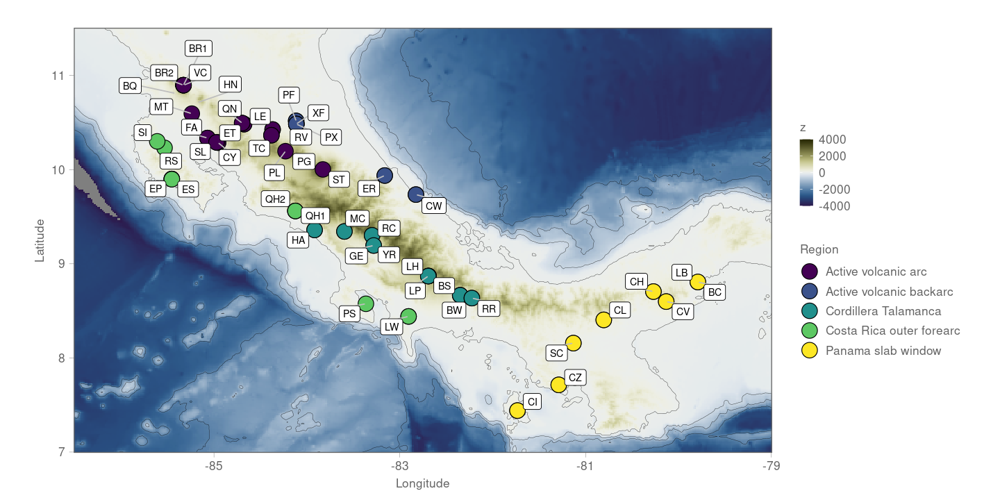

In [25]:
ggplot(bat, aes(x=x, y=y)) +
  coord_quickmap() +
  geom_raster(aes(fill=z)) +
  scale_fill_scico(palette = "broc", limits = c(-4000, 4000)) +

  geom_contour(aes(z=z),
               breaks=c(0, -500, -1000, -2000, -10000), colour="grey3", size=0.1) +
  scale_x_continuous(expand=c(0,0)) +
  scale_y_continuous(expand=c(0,0)) +

  new_scale_fill() +
  geom_point(data = sample_data(prok_ndata), aes(y=latitude, x=longitude, fill=location3), shape = 21, size = 6) +
  guides(color = guide_legend(override.aes = list(size = 6))) +
  scale_fill_viridis(discrete=TRUE) +

  geom_label_repel(data = coord, size = 3, segment.color ="grey",
                 aes(x = longitude, y = latitude, label = code), max.overlaps = 30) +

  labs(title = "",
       fill = "Region",
       x = "Longitude",
       y = "Latitude",
       z="Elevation (m)") +

theme_glab(base_size = 16)

  ggsave("Figure_1A - map.svg", width = 10, height = 6)

In [52]:
## Figure 1B - PCA
## Figure  1B -  PCA

pc <- prcomp(na.omit(coord[,c(113:132)]),
             center = TRUE,
            scale. = TRUE)

In [58]:
summary(pc)

Importance of components:
                          PC1    PC2    PC3     PC4     PC5     PC6    PC7
Standard deviation     3.0587 2.0753 1.6608 1.13168 0.88298 0.69973 0.6371
Proportion of Variance 0.4678 0.2153 0.1379 0.06403 0.03898 0.02448 0.0203
Cumulative Proportion  0.4678 0.6831 0.8210 0.88508 0.92406 0.94854 0.9688
                           PC8     PC9    PC10    PC11    PC12    PC13    PC14
Standard deviation     0.51513 0.41567 0.29241 0.20742 0.16619 0.11703 0.08185
Proportion of Variance 0.01327 0.00864 0.00428 0.00215 0.00138 0.00068 0.00033
Cumulative Proportion  0.98210 0.99074 0.99502 0.99717 0.99855 0.99924 0.99957
                          PC15    PC16    PC17    PC18    PC19     PC20
Standard deviation     0.06386 0.05126 0.03310 0.02279 0.01611 0.004025
Proportion of Variance 0.00020 0.00013 0.00005 0.00003 0.00001 0.000000
Cumulative Proportion  0.99977 0.99991 0.99996 0.99999 1.00000 1.000000

In [53]:
# remove unwanted samples (liune 2) because na.omit removes the entire row with NA
# Check with line is the NA before removing it

groups <- as.factor(coord[-2,13])
site_code <- as.factor(coord[-2,2])

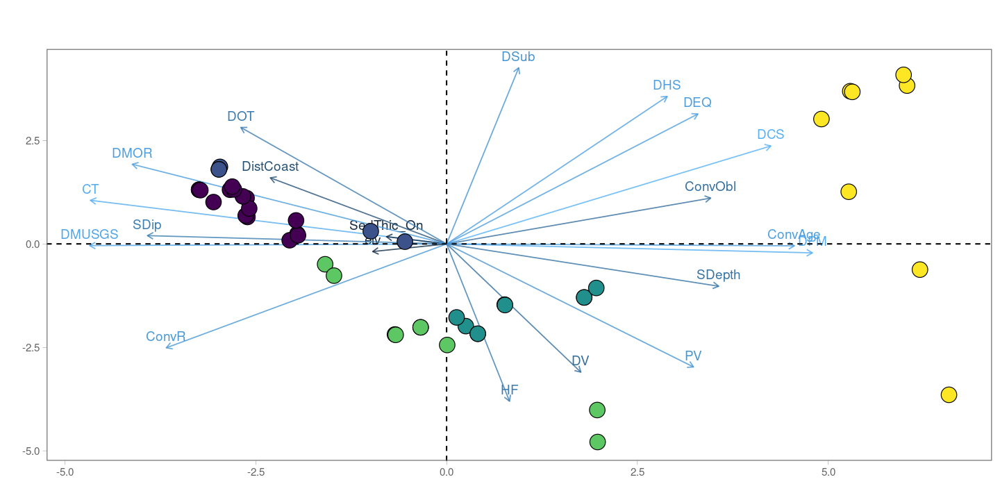

In [56]:
fviz_pca_biplot(pc, obs.scale = 1, var.scale = 1, alpha=0.8,
                label = "var",
                col.var = "contrib") + 
  geom_point(aes(fill = factor(groups)), size = 6, shape=21) +
   scale_fill_viridis(discrete=TRUE)+

#    geom_text_repel(aes(label = site_code), size = 4, color = "black", force = 5, max.overlaps = 30)+


 guides(fill=guide_legend(override.aes=list(shape=21)))+

labs(title="",
     subtitle="",
     fill="Region",
     fill="Contribution",
     y="",
     x="") +

   theme_glab(base_size = 14)+
theme(legend.position = "none")

ggsave("Figure_1B - PCA_nolegned.svg", width=8, height=6)

Warning message:
“Removed 1 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_point()`).”


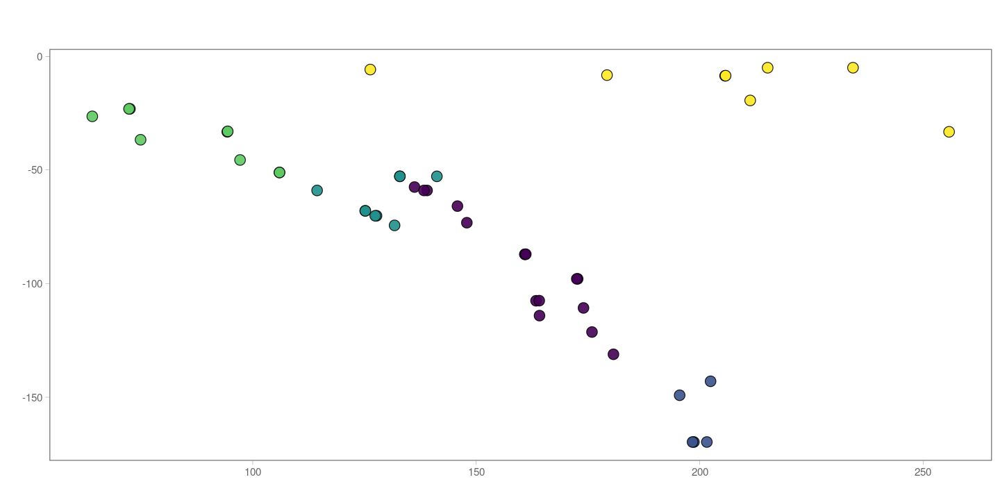

In [27]:
## Figure 1C - subduction visualized
ggplot(coord, aes(DSub, SDepth, fill=location3))+
  geom_point(shape = 21, size = 4, alpha = 0.9)+
  scale_fill_viridis(discrete=T)+
  scale_size_continuous(range = c(0.1, 15))+
  scale_shape_manual(values=c(21,22,23,24,25)) +

labs(title="",
     subtitle="",
     fill="Region",
     y="",
     x="") +
   theme_glab(base_size = 14)+
theme(legend.position = "none")

ggsave("Figure_1C - depth.svg", width=4, height=6)

Warning message:
“The `size` argument of `element_rect()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead.”
Warning message:
“Removed 1 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_text_repel()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_text_repel()`).”


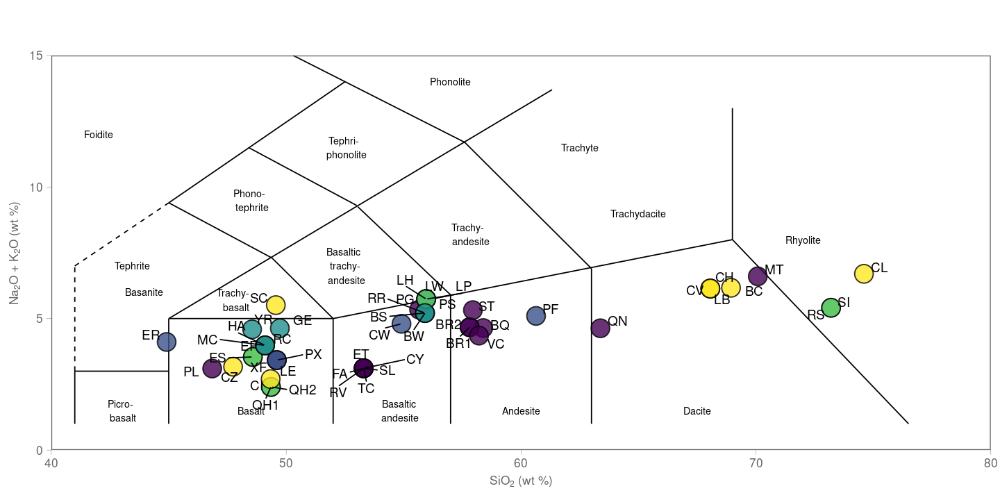

In [28]:
## Figure 2A - TAS
  
p <- ggplot(data=coord, mapping=aes(x=sio2_d,y=na2o_d+k2o_d,color=tectonics4)) +
    geom_blank() +
    theme(panel.grid.major = element_blank(),
          panel.grid.minor = element_blank()) +
    scale_y_continuous(limits=c(0,15), expand = c(0, 0)) + 
    scale_x_continuous(limits=c(40,80), expand = c(0, 0)) +
    labs(y=expression(Na[2]*O + K[2]*O*~ wt~'%'), x=expression(SiO[2]*~ wt~'%'))+
    annotate("segment", x=45, xend=45, y=1, yend=5)+
    annotate("segment", x=45, xend=52, y=5, yend=5)+
    annotate("segment", x=52, xend=69, y=5, yend=8)+
    annotate("segment", x=76.5, xend=69, y=1, yend=8)+
    annotate("segment", x=69, xend=69, y=8, yend=13)+
    annotate("segment", x=45, xend=61.32, y=5, yend=13.7)+
    annotate("segment", x=52, xend=52, y=1, yend=5)+
    annotate("segment", x=57, xend=57, y=1, yend=5.9)+
    annotate("segment", x=63, xend=63, y=1, yend=6.9)+
    annotate("segment", x=52, xend=49.4, y=5, yend=7.3)+
    annotate("segment", x=57, xend=53.05, y=5.9, yend=9.25)+
    annotate("segment", x=63, xend=57.6, y=6.9, yend=11.7)+
    annotate("segment", x=41, xend=45, y=3, yend=3)+
    annotate("segment", x=41, xend=41, y=1, yend=3)+
    annotate("segment", x=41, xend=41, y=3, yend=7, linetype="dashed")+
    annotate("segment", x=41, xend=45, y=7, yend=9.4, linetype="dashed")+
    annotate("segment", x=45, xend=52.5, y=9.4, yend=14)+
    annotate("segment", x=49.4, xend=45, y=7.3, yend=9.4)+
    annotate("segment", x=53, xend=48.4, y=9.3, yend=11.5)+
    annotate("segment", x=57.6, xend=50.3, y=11.7, yend=15)
  
tas <- p + annotate("text", label = "Basalt", x = 48.5, y = 1.5, size=3)+
    annotate("text", label = "Basaltic\n andesite", x = 54.8, y = 1.5, size=3)+
    annotate("text", label = "Andesite", x = 60, y = 1.5, size=3)+
    annotate("text", label = "Dacite", x = 67.5, y = 1.5, size=3)+
    annotate("text", label = "Rhyolite", x = 72, y = 8, size=3)+
    annotate("text", label = "Trachy- \n basalt", x = 47.8, y = 5.7, size=3)+
    annotate("text", label = "Basaltic \n trachy- \n andesite", x = 52.5, y = 7, size=3)+
    annotate("text", label = "Trachy- \n andesite", x = 57.8, y = 8.2, size=3)+
    annotate("text", label = "Trachydacite", x = 65, y = 9, size=3)+
    annotate("text", label = "Trachyte", x = 62.5, y = 11.5, size=3)+
    annotate("text", label = "Picro- \n basalt", x = 43, y = 1.5, size=3)+
    annotate("text", label = "Basanite ", x = 44, y = 6, size=3)+
    annotate("text", label = "Tephrite ", x = 43.5, y = 7, size=3)+
    annotate("text", label = "Phono- \n tephrite", x = 48.5, y = 9.5, size=3)+
    annotate("text", label = "Tephri- \n phonolite", x = 52.5, y = 11.5, size=3)+
    annotate("text", label = "Phonolite", x = 57, y = 14, size=3)+
    annotate("text", label = "Foidite", x = 42, y = 12, size=3)+
    geom_point(data = coord, aes(x=sio2_d,y=na2o_d+k2o_d, fill = location3) , shape = 21, size=7, stroke=0.8, alpha=0.8, color ="black")+
    theme(panel.border = element_rect(colour = "black", fill=NA, size=0))+
    # geom_label_repel(mapping = aes(label = code), size = 2, color = "black", 
    #              fill= "white", force = 1, seed = 10, max.overlaps = 30)+ 
    geom_text_repel(aes(label = code), size = 4, color = "black", force = 5, max.overlaps = 30)+
    scale_fill_viridis(discrete=TRUE)+

labs(title="",
     subtitle="",
     fill="Region",
     y=expression("Na" ["2"] *"O + K" ["2"] *"O (wt %)"),
     x=expression("SiO" ["2"] *" (wt %)")) +

theme_glab(base_size=16)+
theme(legend.position = "none")

  tas

ggsave("Figure_2A-TAS.svg", width=12, height=8)

Registered S3 methods overwritten by 'ggtern':
  method           from   
  grid.draw.ggplot ggplot2
  plot.ggplot      ggplot2
  print.ggplot     ggplot2

Warning message:
“Removed 1 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_text()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_text()`).”


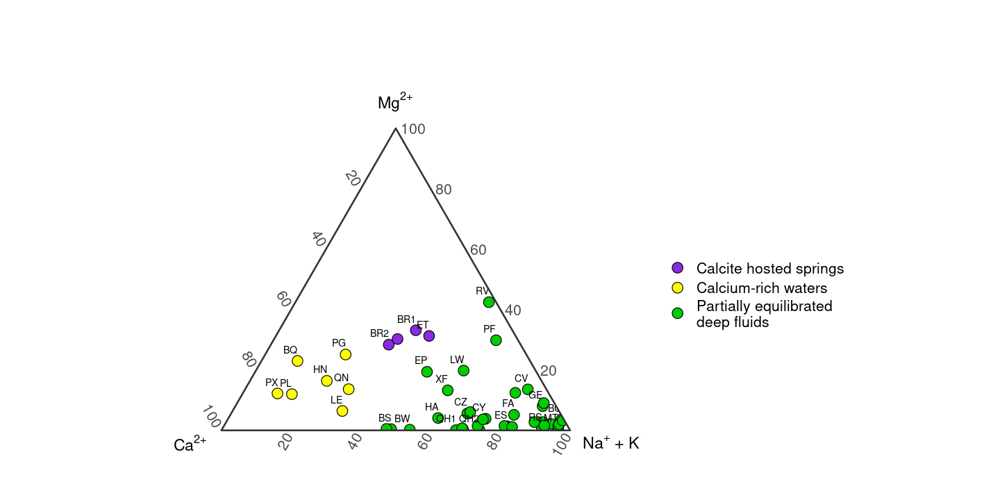

In [29]:
## Figure 2B - Cations
  cations_plot <- ggtern::ggtern(data=coord, aes(x=ca*40.1,y=mg*24.3, z=(na*23)+(k*39.1))) +

    geom_point(aes(fill=Ca_Set),  shape = 21, size=4) +
    geom_text(aes(label= code), size=3, hjust = 1, vjust = -1, check_overlap = T) +

    scale_fill_manual(values=c("blueviolet", "yellow", "green3")) +

labs(title="",
     subtitle="",
     fill="",
     z=expression("Na" ^{"+"} *" + K" ^{"+"}),
     x=expression("Ca" ^{2*"+"}),
     y=expression("Mg" ^{2*"+"}))+

    theme_bw(base_size=16) +
    theme(axis.title=element_text(size=14))

cations_plot

  ggtern::ggsave("Figure_2B-cations.svg", width=12, height=6)

Warning message:
“Removed 9 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing values (`geom_text()`).”
Warning message:
“Removed 9 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing values (`geom_text()`).”


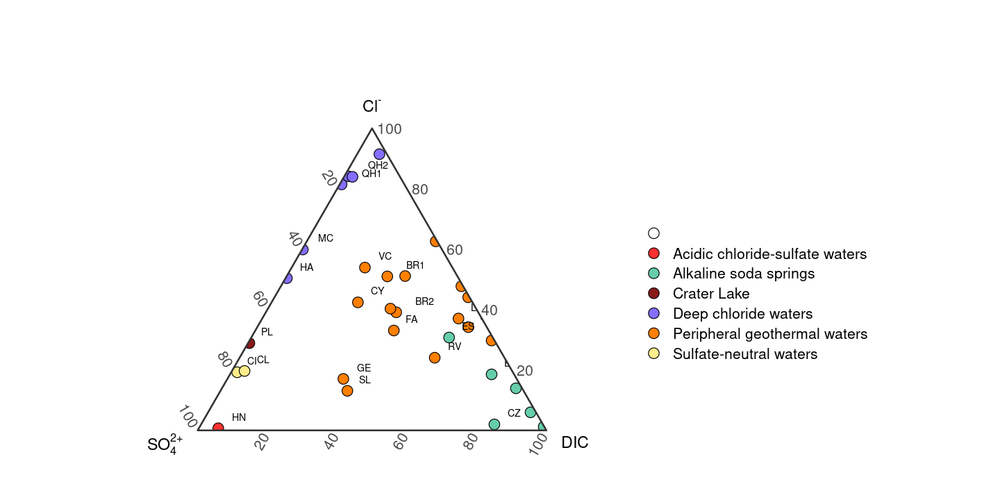

In [30]:
## Figure 2C - Anions
  cations_plot <- ggtern::ggtern(data=coord, aes(x=so4*96,y=cl*35.45, z=dic*61)) +

    geom_point(aes(fill=Cl_Set),  shape = 21, size=4) +
    geom_text(aes(label= code), size=3, hjust = -1, vjust = -1, check_overlap = T) +

    scale_fill_manual(values=c("#FFFFFFFF",  "firebrick1",  "aquamarine3",  "firebrick4",  "slateblue1" , "darkorange1", "lightgoldenrod1")) +

labs(title="",
     subtitle="",
     fill="",
     z=expression("DIC"),
     x=expression("SO" [4]^{2*"+"}),
     y=expression("Cl" ^{"-"}))+

    theme_bw(base_size=16) +
    theme(axis.title=element_text(size=14))

cations_plot

  ggtern::ggsave("Figure_2C-anions.svg", width=12, height=6)

Warning message:
“Removed 1 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_text()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_text()`).”


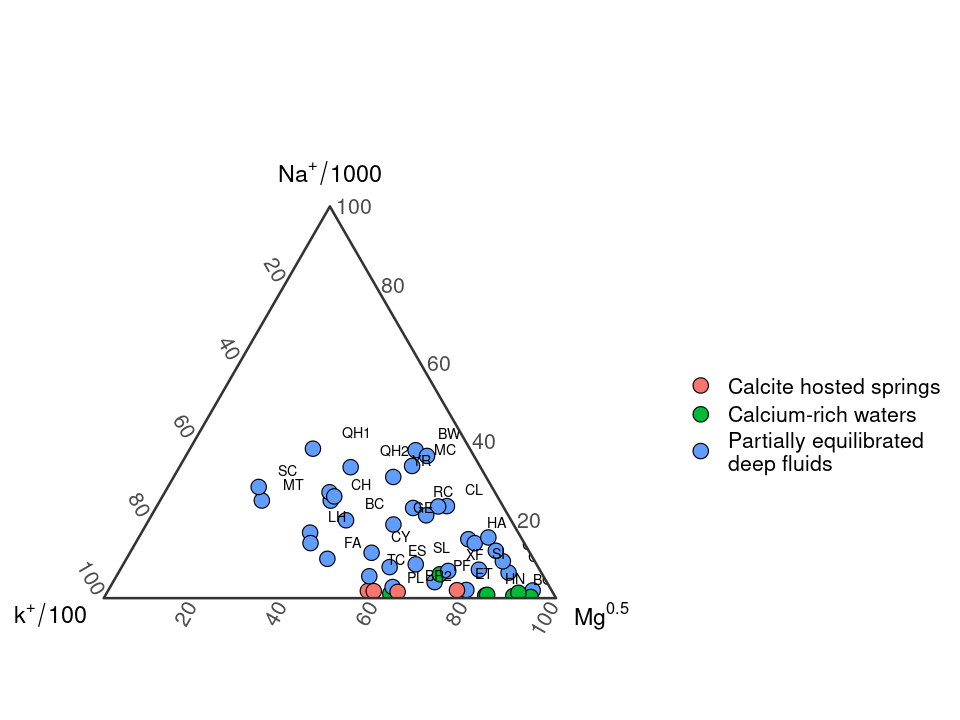

In [9]:
## Supplementary Figure  - Maturation Plot
  cations_plot <- ggtern::ggtern(data=coord, aes(x=(k*39.1)/10,y=(na*23)/400, z=(mg*24.3)^0.5)) +

    geom_point(aes(fill=Ca_Set),  shape = 21, size=4) +
    geom_text(aes(label= code), size=3, hjust = -1, vjust = -1, check_overlap = T) +

    #scale_fill_manual(values=c("#FFFFFFFF", "lightgoldenrod1", "firebrick1", "aquamarine3","firebrick4", "slateblue1", "darkorange1")) +

labs(title="",
     subtitle="",
     fill="",
     z=expression("Mg" ^{0.5}),
     x=expression("k" ^{"+"}/100),
     y=expression("Na" ^{"+"}/1000))+

    theme_bw(base_size=16) +
    theme(axis.title=element_text(size=14))

cations_plot

  ggtern::ggsave("Figure_S-maturation.svg", width=12, height=6)

In [60]:
##  Figure 3  Hierarchical tree and Barplot
#  hierarchical cluster plot

dist.bray<-vegdist(t(otu_table(prok_ndata)),method="jaccard")
hc_bray <- hclust(dist.bray, method = "average") # heirarchal clustering
# the agglomeration method to be used. 
# This should be (an unambiguous abbreviation of) one of "ward.D", "ward.D2", "single", "complete", "average" (= UPGMA), "mcquitty" (= WPGMA), "median" (= WPGMC) or "centroid" (= UPGMC).
#convert cluster object to use with ggplot
sample_norm <- sample_data(prok_ndata)
dendr    <- dendro_data(hc_bray, type="rectangle") # convert for ggplot

In [61]:
## !! ## 
#  add the grouping factor
clust.df <- data.frame(label = sample_norm$code, cluster =factor(sample_norm$location3))
 clust    <- cutree(hc_bray,k=3)                    # find 2 clusters
# dendr[["labels"]] has the labels, merge with clust.df based on label column
dendr[["labels"]] <- merge(dendr[["labels"]],clust.df, by="label")

In [62]:
# Change the plot size for Figure 3
options(repr.plot.width=12, repr.plot.height=18)

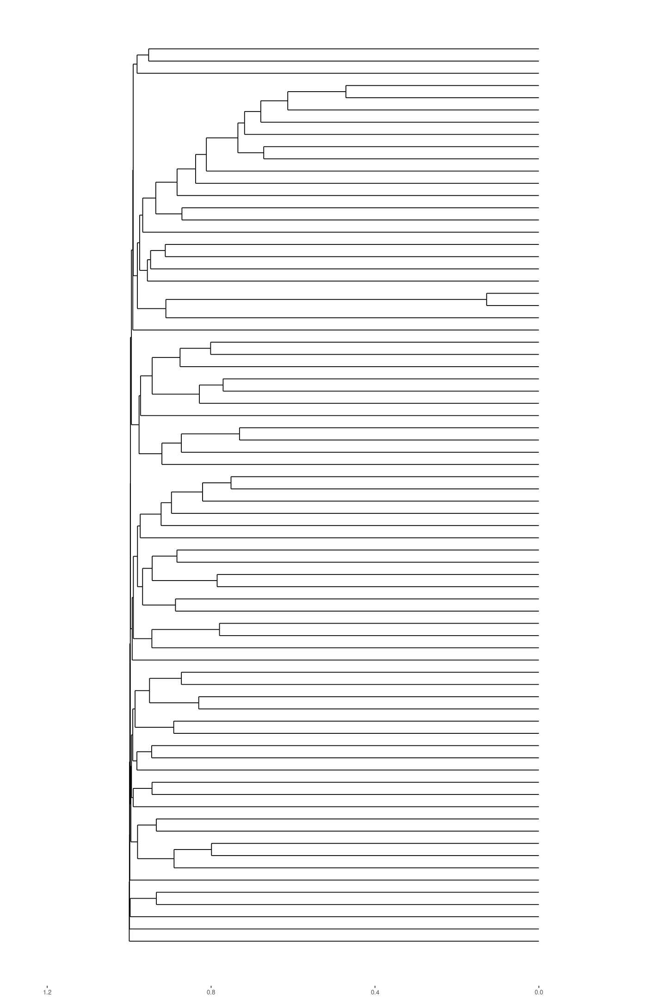

In [83]:
# plot the dendrogram; note use of color=cluster in geom_text(...)
hclust_filt <- ggplot() + 
  geom_segment(data=segment(dendr), aes(x=x, y=y, xend=xend, yend=yend)) + 
  geom_text(data=label(dendr), aes(x, y, label=label, hjust=0, color=cluster),   size=2.5) +
  geom_text(data=dendr$label, aes(x, y, label=label, hjust=-0.5, fontface = "bold"),  size=2) +
#  geom_point(data=dendr$label, aes(x, y,  fill=cluster),  size=2) +
  scale_fill_manual(values = c("darkslateblue", "turquoise1", "dodgerblue2", "green2", "yellow"))+
  coord_flip() + scale_y_reverse(expand=c(0.3, 0)) + 
  theme(axis.line.y=element_blank(),
        axis.ticks.y=element_blank(),
        axis.text.y=element_blank(),
        axis.title.y=element_blank(),
        axis.title.x = element_blank(),
        axis.text = element_text(size = (8)),
        panel.background=element_rect(fill="white"),
#        plot.margin = unit(c(0, 0.5,0, 0), "cm"),
        panel.grid=element_blank())+
#  theme(plot.margin = unit(c(0.5,-10,0.5,2), "pt"))+
  scale_shape_manual(values=c(21,22,23,24,25))+
  theme(legend.position = "none")

hclust_filt

In [64]:
#    Barplot

ps_norm_rel <- transform_sample_counts(prok_ndata, function(x) ((x / sum(x))*100))
ps_phylum_rel = tax_glom(ps_norm_rel, taxrank="Phylum", NArm=FALSE)
ps_class_rel = tax_glom(ps_norm_rel, taxrank="Class", NArm=FALSE)
#    script for plotbar with phylum > 1% of abundance
#    be careful of the otu-table orientation

ps_norm_phylum_prune <- prune_taxa(taxa_sums(ps_phylum_rel) > sum(readcount(ps_phylum_rel))/100, ps_phylum_rel)
phy_norm <- data.frame(otu_table(ps_norm_phylum_prune))
Others_norm <- c(colSums(subset(otu_table(ps_phylum_rel), taxa_sums(ps_phylum_rel) < sum(readcount(ps_phylum_rel)/100))))
phy_norm<- rbind(phy_norm, Others_norm)
list <- c(data.frame(tax_table(ps_norm_phylum_prune))$Phylum, "Others")
list[is.na(list)] <- "NA"
row.names(phy_norm) <- list
                                       
# process Proteobacteria abundances, in order to visualise at Class level
phy_norm_prune_proteoB<- phy_norm[!(row.names(phy_norm) %in% c("Proteobacteria")), ]
ps_proteo <- subset_taxa(ps_class_rel, Phylum == "Proteobacteria")
ps_proteo_class = tax_glom(ps_proteo, taxrank="Class", NArm=FALSE)
phy_proteo <- data.frame(otu_table(ps_proteo_class))
Proteo_Class <- c(data.frame(tax_table(ps_proteo_class))$Class)
                                       
# if is present an "NA" group in Proteobacteria
Proteo_Class[is.na(Proteo_Class)] = "NA Proteobacteria"
row.names(phy_proteo) <- Proteo_Class
phy_tab <- rbind(phy_proteo, phy_norm_prune_proteoB)

In [65]:
# Gathering data  !!!
# for the ggplot barplot
phy_tab$Taxa <- row.names(phy_tab)
aggdata_phy <- gather(phy_tab, key = "sample", value = "Abundance", -Taxa)

# Converte to factor for preserving sequence in our visualisation
# same for the sample
aggdata_phy$Taxa<- factor(aggdata_phy$Taxa,  levels = unique(aggdata_phy$Taxa))
aggdata_phy$sample<- factor(aggdata_phy$sample,  levels = unique(aggdata_phy$sample))

In [66]:
# use the hclust order for the barplot 
dendr_for_barplot <- as.dendrogram(hc_bray)
aggdata_phy$sample <- factor(aggdata_phy$sample, levels = labels(dendr_for_barplot))

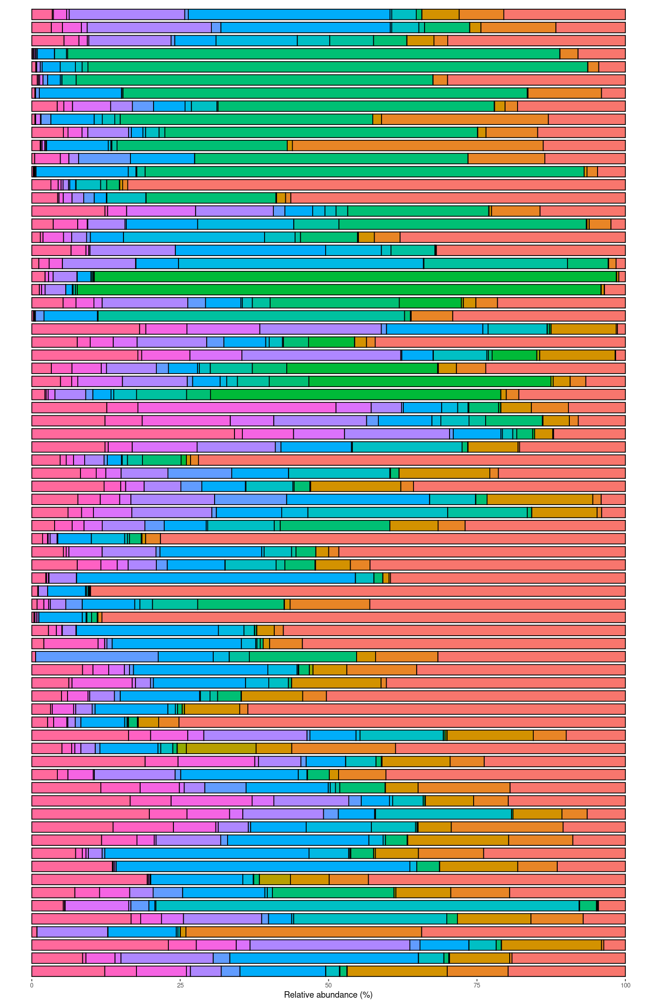

In [67]:
mainplot <- ggplot(aggdata_phy, aes(width = 0.8, fill=Taxa, y=Abundance, x=sample)) +
  geom_bar(position="stack", stat="identity", color="black") +
  #scale_x_discrete(guide = guide_axis(angle = 0)) +
  #scale_x_discrete(limits = rev)+
  labs(y = "Relative abundance (%)")+
  coord_flip()+
  #scale_fill_manual(values=mycols4)+ coord_flip() +  # per girarlo orizzontalmente
  theme(plot.margin = unit(c(18,2,5,0), "pt"))+
  theme(axis.title.y = element_blank(), 
        panel.background=element_rect(fill="white"),
        plot.margin = unit(c(0.3, 0.5,0, 0), "cm"),
        axis.text = element_text(size = (8)),
        panel.grid=element_blank(),
        axis.text.y=element_blank(),
        axis.ticks.y=element_blank())+
  theme(legend.position = "none")
mainplot

In [68]:
# visualization of several variable using the same order of the cluster

code <- sample_data(prok_ndata)$code
Temp<- sample_data(prok_ndata)$Temp
pH<- sample_data(prok_ndata)$pH
rc_ra<- sample_data(prok_ndata)$rc_ra
df_var <- data.frame(code, Temp , pH, rc_ra)
df_var$Var_code <- "Var"

In [69]:
df_var$code <- levels(factor(df_var$code, levels = labels(dendr_for_barplot)))

In [70]:
col_temp<-ggplot(df_var, aes(Var_code, code, fill= Temp)) + 
  geom_tile(color="black")+
scale_fill_viridis_c(option = "plasma")+

labs(fill="temp (°C)")+
theme_glab(base_size=16)+
theme(axis.text.y = element_blank(), axis.text.x = element_blank(),
        axis.ticks.y =  element_blank(),axis.title = element_blank(),
        axis.ticks.x =  element_blank(),
        panel.grid.major = element_blank())+
  theme(legend.position = "none")

In [71]:
col_pH<-ggplot(df_var, aes(Var_code, code, fill=pH)) + 

  geom_tile(color="black")+
  scale_fill_viridis(option = "G",  direction = -1)+

labs(fill="pH")+
theme_glab(base_size=16)+
theme(axis.text.y = element_blank(), axis.text.x = element_blank(),
        axis.ticks.y =  element_blank(),axis.title = element_blank(),
        axis.ticks.x =  element_blank(),
        panel.grid.major = element_blank())+
  theme(legend.position = "none")

In [72]:
##  rc_ra
col_rc_ra<-ggplot(df_var, aes(Var_code, code, fill= rc_ra)) + 
  geom_tile(color="black")+

scale_fill_viridis(option = "D")+

labs(fill="Rc/Ra")+
theme_glab(base_size=16)+
theme(axis.text.y = element_blank(), axis.text.x = element_blank(),
        axis.ticks.y =  element_blank(),axis.title = element_blank(),
        axis.ticks.x =  element_blank(),
        panel.grid.major = element_blank())+
  theme(legend.position = "none")

In [73]:
#  add legend
legend_bar<-as.ggplot(get_legend(ggplot(aggdata_phy, aes(sample, Abundance))+
                                geom_point(aes(color=Taxa), size = 5)+
                                theme(legend.key = element_blank())+
                                guides(color = guide_legend(title = "Phylum",label.theme = element_text(size = 7,angle = 0), ncol = 4)) + 
                                theme(legend.key.height = unit(1, "mm"))))

Warning message in as_grob.default(plot):
“Cannot convert object of class character into a grob.”


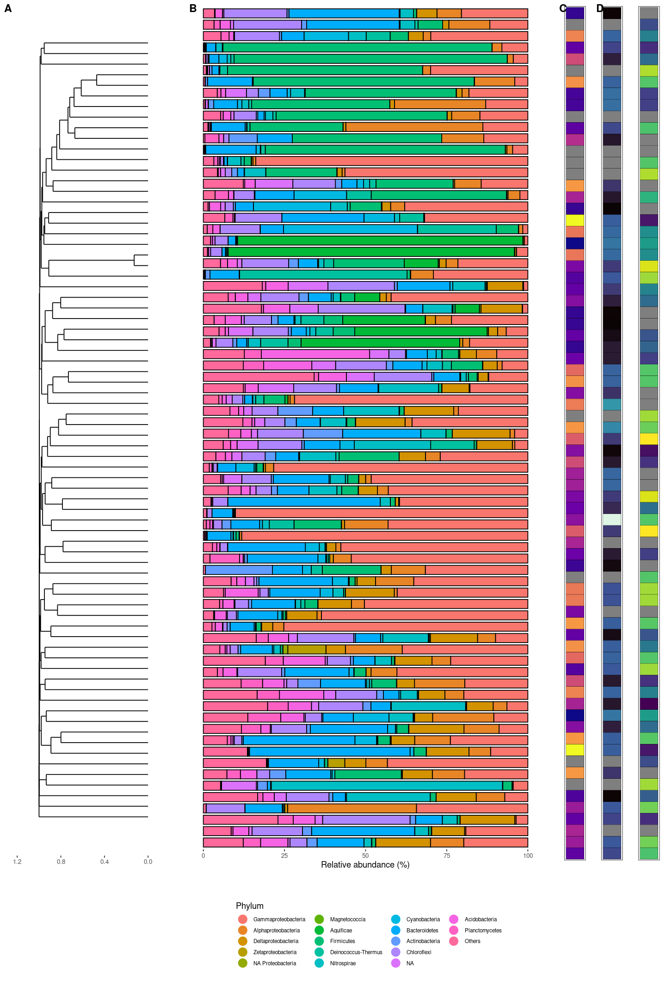

In [91]:

figure3_list <- list(hclust_filt, mainplot, col_temp, col_pH, col_rc_ra, "", legend_bar)

ggarrange(plotlist = figure3_list, labels = c('A', 'B', 'C', 'D'),
          heights = c(2, 0.3), widths = c(1,2,0.2,0.2,0.2), ncol = 5, nrow = 2)

ggsave("Figure_3 - cluster.svg", width=12, height = 18)

In [92]:
# Back to original plot size
options(repr.plot.width=12, repr.plot.height=8)

In [97]:
save.image()

In [93]:
## Figure 4

In [100]:
set.seed(9)

In [94]:
## Crfeate the starting nMDS plots
# Create the weighted and unweighted distance matrices
ps_j_un <- distance(prok_ndata, method = "bray", binary = TRUE)
ps_j_w <- distance(prok_ndata, method = "jsd")

In [101]:
prok_nmds_w_3d <- vegan::metaMDS(ps_j_w, k = 3)

Run 0 stress 0.1762423 
Run 1 stress 0.17624 
... New best solution
... Procrustes: rmse 0.001499996  max resid 0.009832461 
... Similar to previous best
Run 2 stress 0.177519 
Run 3 stress 0.1763542 
... Procrustes: rmse 0.01394705  max resid 0.0896283 
Run 4 stress 0.1769909 
Run 5 stress 0.1763786 
... Procrustes: rmse 0.02260766  max resid 0.1582066 
Run 6 stress 0.1762426 
... Procrustes: rmse 0.001334363  max resid 0.007473732 
... Similar to previous best
Run 7 stress 0.1763784 
... Procrustes: rmse 0.02265239  max resid 0.1585631 
Run 8 stress 0.1769802 
Run 9 stress 0.1769849 
Run 10 stress 0.1763786 
... Procrustes: rmse 0.02238451  max resid 0.1588369 
Run 11 stress 0.1769793 
Run 12 stress 0.1775186 
Run 13 stress 0.1763528 
... Procrustes: rmse 0.01353683  max resid 0.08748289 
Run 14 stress 0.1763881 
... Procrustes: rmse 0.02223264  max resid 0.1585716 
Run 15 stress 0.1769885 
Run 16 stress 0.176354 
... Procrustes: rmse 0.01377373  max resid 0.08859411 
Run 17 stress 0

In [102]:
test <- as.data.frame(prok_nmds_w_3d$points)
test <- as.data.frame(test)
test2 <- merge(database, test,  by=0, all.x=TRUE)

In [252]:
# Back to original plot size
options(repr.plot.width=16, repr.plot.height=12)

In [262]:
plot_ly(test2, x = ~MDS1, y = ~MDS2, z = ~MDS3,
              mode = "markers",
              type = "scatter3d",
              color=~location3,
              marker=list(size=6),
              colors= c("#440154", "#414487", "#2a788e", "#22a884", "#7ad151", "#fde725")
)

#440154, #414487, #2a788e, #22a884, #7ad151, #fde725

Warning message:
“Ignoring 9 observations”
Warning message:
“Ignoring 9 observations”


HTML widgets cannot be represented in plain text (need html)

In [237]:
fig <- plot_ly(test2, x = ~MDS1, y = ~MDS2, z = ~MDS3,
              mode = "markers",
              type = "scatter3d",
              #color = ~sample_type
              color = ~location3
              )
fig

Warning message:
“Ignoring 9 observations”
Warning message:
“Ignoring 9 observations”


HTML widgets cannot be represented in plain text (need html)

In [ ]:
# Back to original plot size
options(repr.plot.width=12, repr.plot.height=8)

In [99]:
## nMDS with Jaccard weighted and unweighted
prok_nmds_w <- ordinate(prok_ndata, ps_j_w, method = "NMDS", trymax=100)
prok_nmds_uw <- ordinate(prok_ndata, ps_j_un, method = "NMDS", trymax=100)

Run 0 stress 0.2549021 
Run 1 stress 0.2540319 
... New best solution
... Procrustes: rmse 0.09382654  max resid 0.3176469 
Run 2 stress 0.2585716 
Run 3 stress 0.2556814 
Run 4 stress 0.2560778 
Run 5 stress 0.2597125 
Run 6 stress 0.2499622 
... New best solution
... Procrustes: rmse 0.03434973  max resid 0.2429107 
Run 7 stress 0.2497254 
... New best solution
... Procrustes: rmse 0.005736242  max resid 0.04619277 
Run 8 stress 0.2608322 
Run 9 stress 0.2499622 
... Procrustes: rmse 0.01004615  max resid 0.07784415 
Run 10 stress 0.2702472 
Run 11 stress 0.2589762 
Run 12 stress 0.2582228 
Run 13 stress 0.2621892 
Run 14 stress 0.2563174 
Run 15 stress 0.2529214 
Run 16 stress 0.2528937 
Run 17 stress 0.2622679 
Run 18 stress 0.2610769 
Run 19 stress 0.27763 
Run 20 stress 0.2635654 
*** Best solution was not repeated -- monoMDS stopping criteria:
    20: stress ratio > sratmax
Run 0 stress 0.2535833 
Run 1 stress 0.2570158 
Run 2 stress 0.2567904 
Run 3 stress 0.2648916 
Run 4 stre

In [152]:
# Test RDA on Hellinger transformed data
prok.hell <- transform_sample_counts(prok_data, function(x) sqrt(x / sum(x)))

prok_hell_jsd <- distance(prok.hell, method = "jsd")
                                                 
prok_hell_nmds <- prok_nmds_w <- ordinate(prok.hell, prok_hell_jsd, method = "NMDS", trymax=100)
prok_hell_rda <- prok_nmds_w <- ordinate(prok.hell, prok_hell_jsd, method = "RDA", trymax=100)
prok_hell_pcoa <- prok_nmds_w <- ordinate(prok.hell, prok_hell_jsd, method = "PCoA", trymax=100)

Run 0 stress 0.2592879 
Run 1 stress 0.2824168 
Run 2 stress 0.2520747 
... New best solution
... Procrustes: rmse 0.07613485  max resid 0.3717477 
Run 3 stress 0.2552062 
Run 4 stress 0.2611748 
Run 5 stress 0.2479744 
... New best solution
... Procrustes: rmse 0.02844927  max resid 0.1657905 
Run 6 stress 0.2640771 
Run 7 stress 0.2628472 
Run 8 stress 0.2585546 
Run 9 stress 0.2737459 
Run 10 stress 0.2586292 
Run 11 stress 0.2666166 
Run 12 stress 0.2485376 
Run 13 stress 0.2651381 
Run 14 stress 0.2535713 
Run 15 stress 0.2686598 
Run 16 stress 0.2643103 
Run 17 stress 0.253157 
Run 18 stress 0.2664537 
Run 19 stress 0.2558067 
Run 20 stress 0.2752896 
*** Best solution was not repeated -- monoMDS stopping criteria:
    20: stress ratio > sratmax


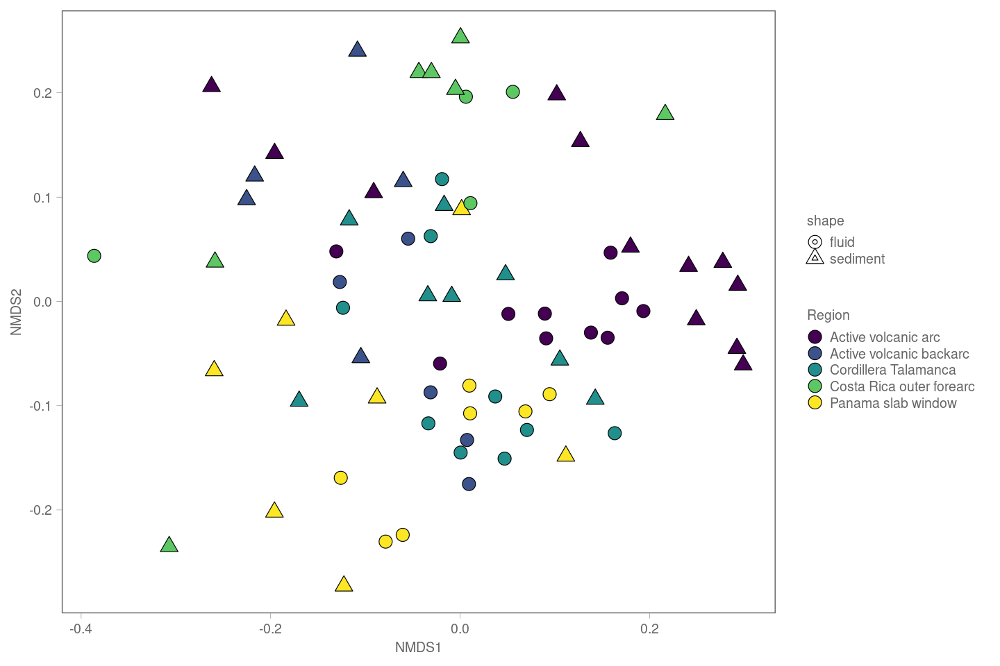

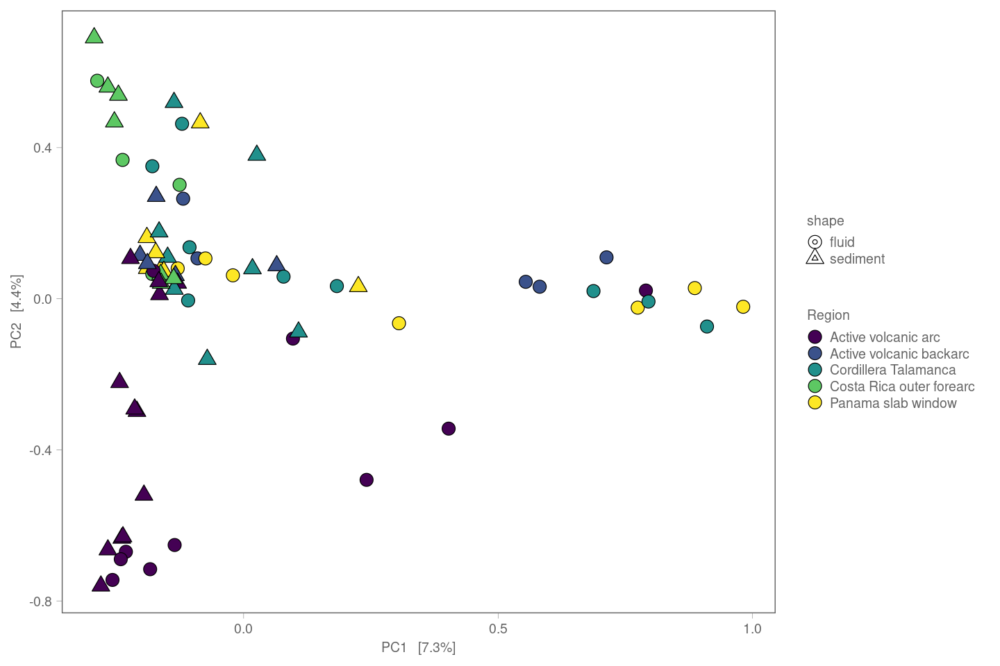

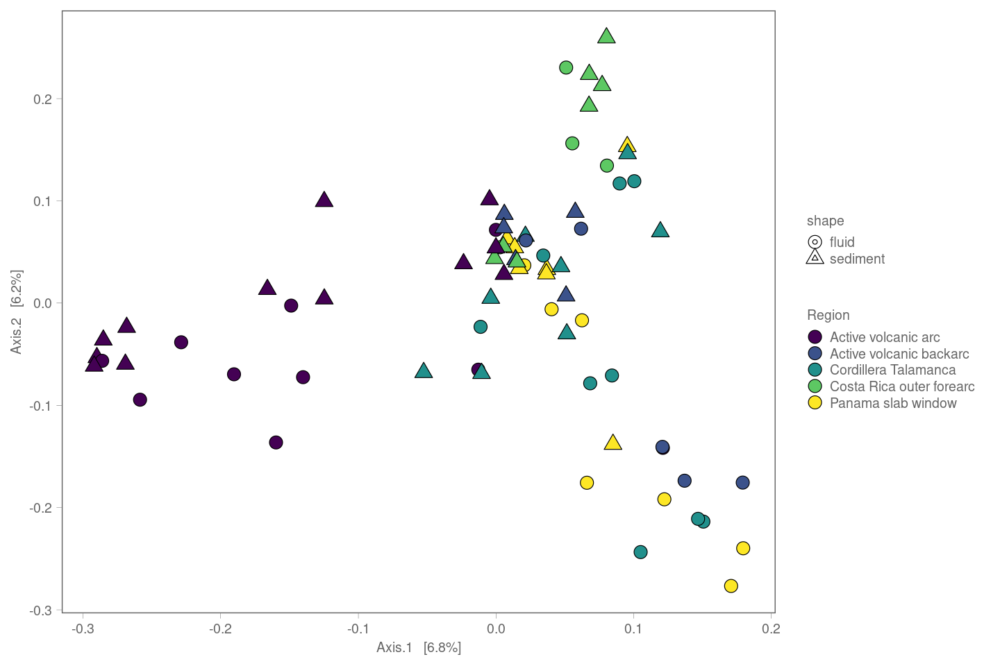

In [153]:
plot_ordination(prok.hell, prok_hell_nmds, type = "sample", axes = c(1,2)) +
  geom_point(aes(fill=location3, shape=sample_type), size=5) +
 # geom_label_repel(aes(label = code), size = 3, color = "black", force = 5, max.overlaps = 30)+
  scale_shape_manual(values = c(21,24))+
 guides(fill=guide_legend(override.aes=list(shape=21)))+
  scale_fill_viridis(discrete = T)+
  labs(fill = "Region")+
theme_glab(base_size=18)

plot_ordination(prok.hell, prok_hell_rda, type = "sample", axes = c(1,2)) +
  geom_point(aes(fill=location3, shape=sample_type), size=5) +
 # geom_label_repel(aes(label = code), size = 3, color = "black", force = 5, max.overlaps = 30)+
  scale_shape_manual(values = c(21,24))+
 guides(fill=guide_legend(override.aes=list(shape=21)))+
  scale_fill_viridis(discrete = T)+
  labs(fill = "Region")+
theme_glab(base_size=18)

plot_ordination(prok.hell, prok_hell_pcoa, type = "sample", axes = c(1,2)) +
  geom_point(aes(fill=location3, shape=sample_type), size=5) +
 # geom_label_repel(aes(label = code), size = 3, color = "black", force = 5, max.overlaps = 30)+
  scale_shape_manual(values = c(21,24))+
 guides(fill=guide_legend(override.aes=list(shape=21)))+
  scale_fill_viridis(discrete = T)+
  labs(fill = "Region")+
theme_glab(base_size=18)

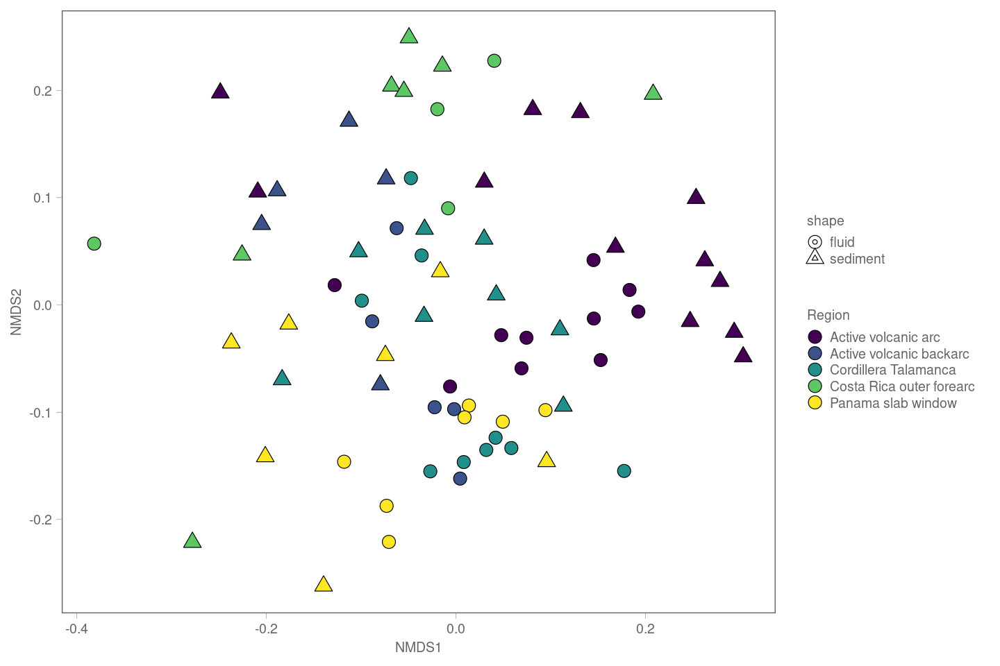

In [107]:
plot_ordination(prok_ndata, prok_nmds_w, type = "sample", axes = c(1,2)) +
  geom_point(aes(fill=location3, shape=sample_type), size=5) +
 # geom_label_repel(aes(label = code), size = 3, color = "black", force = 5, max.overlaps = 30)+
  scale_shape_manual(values = c(21,24))+
 guides(fill=guide_legend(override.aes=list(shape=21)))+
  scale_fill_viridis(discrete = T)+
  labs(fill = "Region")+
theme_glab(base_size=18)

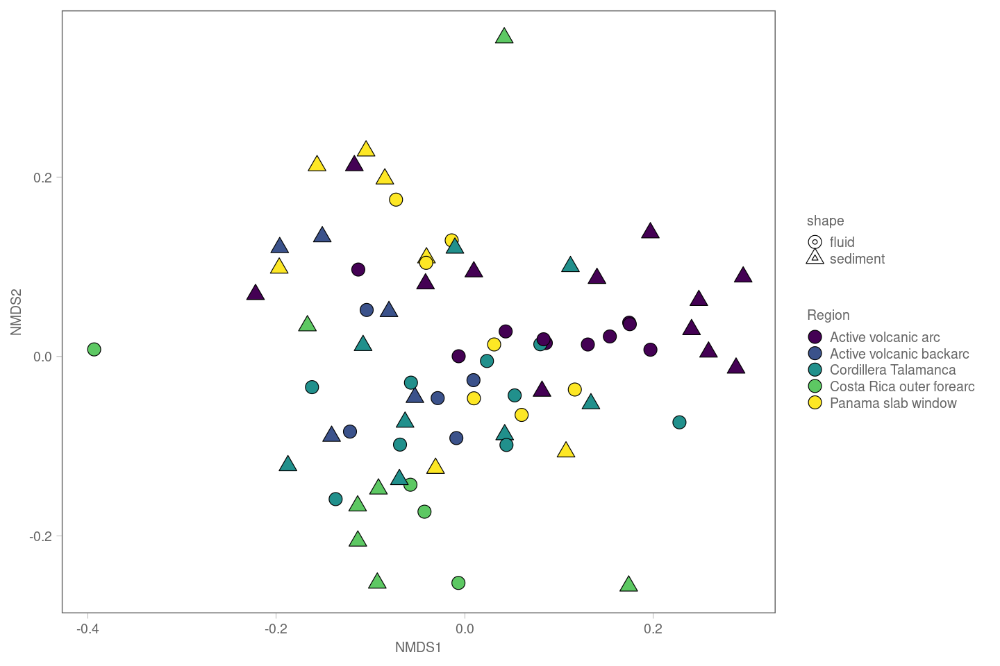

In [108]:
## Figure 4A - nMDS JSD

plot_ordination(prok_ndata, prok_nmds_w_3d, type = "sample", axes=c(1,2)) +
  geom_point(aes(fill=location3, shape=sample_type), size=5) +
  scale_shape_manual(values = c(21,24))+
 guides(fill=guide_legend(override.aes=list(shape=21)))+
 scale_color_viridis(discrete = TRUE)+
  scale_fill_viridis(discrete = TRUE)+
  labs(fill = "Region")+
theme_glab(base_size=18)

ggsave("Figure_4A-nMDS.svg", width=12, height=8)

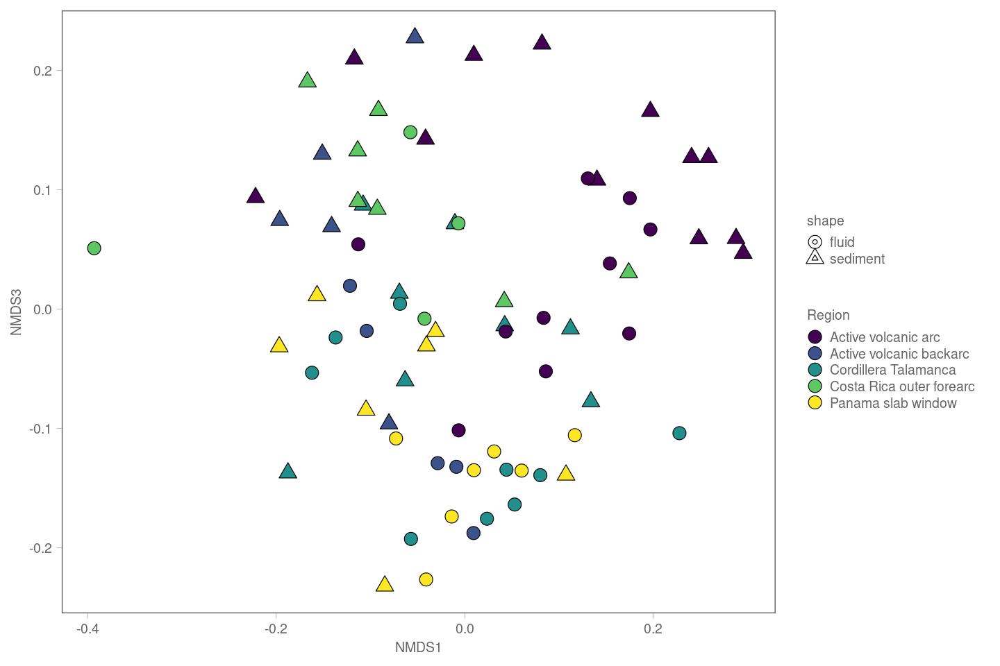

In [231]:
## Figure 4A - nMDS JSD

plot_ordination(prok_ndata, prok_nmds_w_3d, type = "sample", axes=c(1,3)) +
  geom_point(aes(fill=location3, shape=sample_type), size=5) +
  scale_shape_manual(values = c(21,24))+
 guides(fill=guide_legend(override.aes=list(shape=21)))+
 scale_color_viridis(discrete = TRUE)+
  scale_fill_viridis(discrete = TRUE)+
  labs(fill = "Region")+
theme_glab(base_size=18)

ggsave("Figure_4A-nMDS1-3.svg", width=12, height=8)

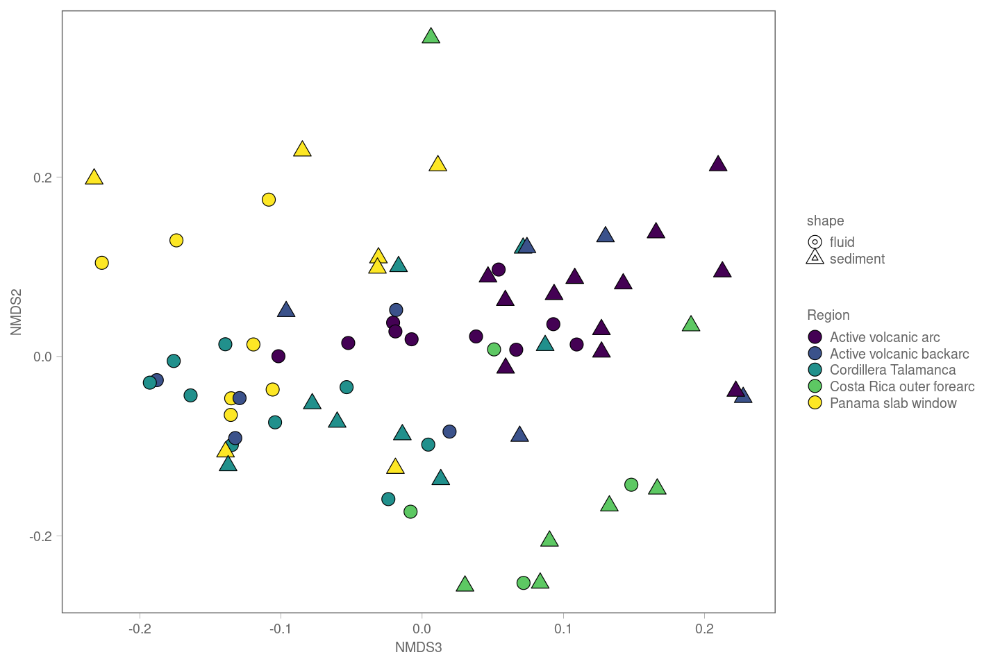

In [233]:
## Figure 4A - nMDS JSD

plot_ordination(prok_ndata, prok_nmds_w_3d, type = "sample", axes=c(3,2)) +
  geom_point(aes(fill=location3, shape=sample_type), size=5) +
  scale_shape_manual(values = c(21,24))+
 guides(fill=guide_legend(override.aes=list(shape=21)))+
 scale_color_viridis(discrete = TRUE)+
  scale_fill_viridis(discrete = TRUE)+
  labs(fill = "Region")+
theme_glab(base_size=18)

ggsave("Figure_4A-nMDS2-3.svg", width=12, height=8)

In [109]:
#ANOSIM Region
anosim(ps_j_w, sample_data(prok_ndata)$location3, permutations = 999)


Call:
anosim(x = ps_j_w, grouping = sample_data(prok_ndata)$location3,      permutations = 999) 
Dissimilarity: 

ANOSIM statistic R: 0.377 
      Significance: 0.001 

Permutation: free
Number of permutations: 999


In [110]:
#ANOSIM Rocks
anosim(ps_j_w, sample_data(prok_ndata)$TAS, permutations = 999)


Call:
anosim(x = ps_j_w, grouping = sample_data(prok_ndata)$TAS, permutations = 999) 
Dissimilarity: 

ANOSIM statistic R: 0.1247 
      Significance: 0.002 

Permutation: free
Number of permutations: 999


In [111]:
#ANOSIM cation
anosim(ps_j_w, sample_data(prok_ndata)$Ca_Set, permutations = 999)


Call:
anosim(x = ps_j_w, grouping = sample_data(prok_ndata)$Ca_Set,      permutations = 999) 
Dissimilarity: 

ANOSIM statistic R: 0.02172 
      Significance: 0.375 

Permutation: free
Number of permutations: 999


In [112]:
#ANOSIM anion
anosim(ps_j_w, sample_data(prok_ndata)$Cl_Set, permutations = 999)


Call:
anosim(x = ps_j_w, grouping = sample_data(prok_ndata)$Cl_Set,      permutations = 999) 
Dissimilarity: 

ANOSIM statistic R: 0.1497 
      Significance: 0.002 

Permutation: free
Number of permutations: 999


In [113]:
#Adonis Temp pH Rc/Ra
adonis2(ps_j_w~sample_data(prok_ndata)$Temp+sample_data(prok_ndata)$pH+sample_data(prok_ndata)$rc_ra, permutations = 999, na.action = na.omit)

,Df,SumOfSqs,R2,F,Pr(>F)
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
sample_data(prok_ndata)$Temp,1,0.6649094,0.06149257,3.208819,0.001
sample_data(prok_ndata)$pH,1,0.4175753,0.03861846,2.015197,0.001
sample_data(prok_ndata)$rc_ra,1,0.4057649,0.03752621,1.958201,0.001
Residual,45,9.3245915,0.86236276,NA,NA
Total,48,10.8128411,1.00000000,NA,NA


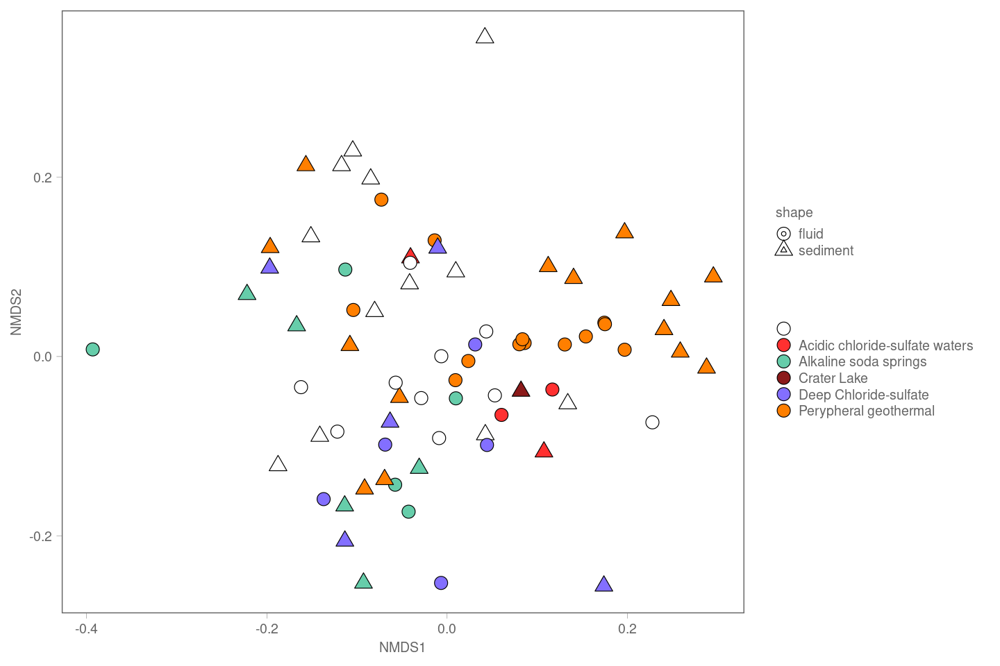

In [228]:
## Figure 4B - nMDS Aniona

plot_ordination(prok_ndata, prok_nmds_w_3d, type = "sample", axes=c(1,2)) +
  geom_point(aes(fill=Cl_Set, shape=sample_type), size=5) +
  scale_shape_manual(values = c(21,24))+
 guides(fill=guide_legend(override.aes=list(shape=21)))+
    scale_fill_manual(values=c("#FFFFFFFF",  "firebrick1",  "aquamarine3",  "firebrick4",  "slateblue1" , "darkorange1", "lightgoldenrod1")) +

  labs(fill = "")+
theme_glab(base_size=18)

ggsave("Figure_4B nMDS anions.svg", width=12, height=8)

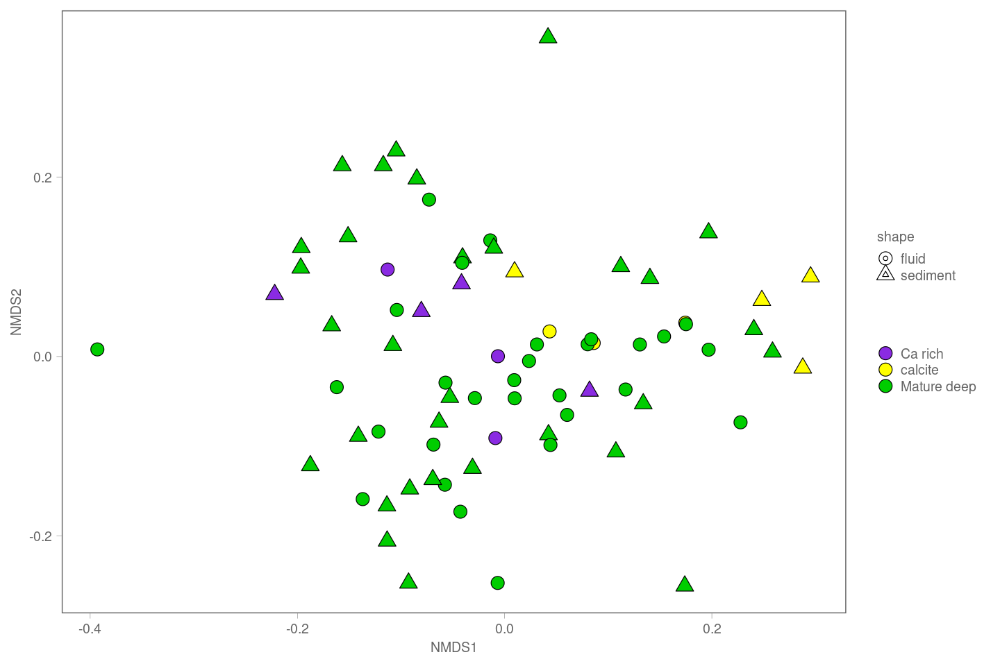

In [116]:
## Figure 4C - nMDS Cation

plot_ordination(prok_ndata, prok_nmds_w_3d, type = "sample", axes=c(1,2)) +
  geom_point(aes(fill=Ca_Set, shape=sample_type), size=5) +
  scale_shape_manual(values = c(21,24))+
 guides(fill=guide_legend(override.aes=list(shape=21)))+
    scale_fill_manual(values=c("blueviolet", "yellow", "green3")) +
  labs(fill = "")+
theme_glab(base_size=18)

ggsave("Figure_4C-nMDS cations.svg", width=12, height=8)

`geom_smooth()` using formula = 'y ~ x'
Warning message:
“Removed 26 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 26 rows containing missing values (`geom_point()`).”
`geom_smooth()` using formula = 'y ~ x'
Warning message:
“Removed 26 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 26 rows containing missing values (`geom_point()`).”



	Pearson's product-moment correlation

data:  test2$MDS3 and test2$rc_ra
t = -2.4467, df = 55, p-value = 0.01764
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 -0.53055786 -0.05742339
sample estimates:
       cor 
-0.3133032 


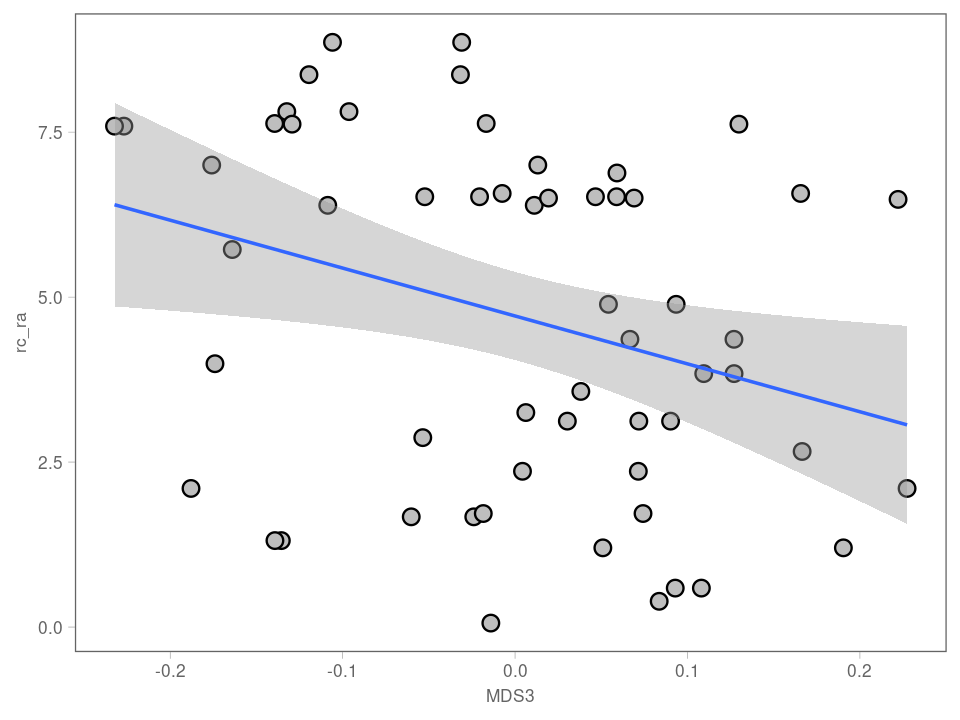

In [10]:
# Fig 4A   - correlation between NMDS axes and variables
# linear model
ggplot(test2,aes(y=rc_ra,x=MDS3)) +
  geom_point(shape = 21, size=4, stroke=1, alpha=1, fill="gray") +
  geom_smooth(method=lm)+
theme_glab(base_size=16)

ggsave("Figure_4A-RcRa.svg", width=12, height=2)

# Statistical correlation
cor.test(test2$MDS3, test2$rc_ra, method = "pearson")

`geom_smooth()` using formula = 'y ~ x'
Warning message:
“Removed 19 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 19 rows containing missing values (`geom_point()`).”
`geom_smooth()` using formula = 'y ~ x'
Warning message:
“Removed 19 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 19 rows containing missing values (`geom_point()`).”



	Pearson's product-moment correlation

data:  test2$MDS1 and test2$Temp
t = 9.4928, df = 62, p-value = 1.072e-13
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.6461114 0.8539304
sample estimates:
    cor 
0.76968 


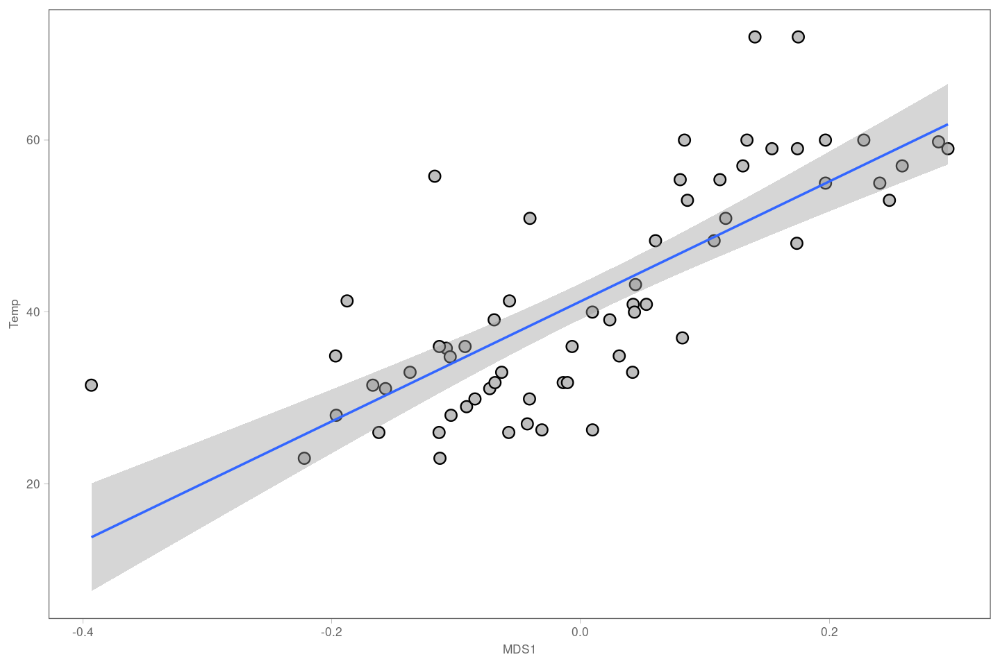

In [118]:
ggplot(test2,aes(x=MDS1,y=Temp)) +
  geom_point(shape = 21, size=4, stroke=1, alpha=1, fill="gray") +
  geom_smooth(method=lm)+
theme_glab(base_size=16)

ggsave("Figure_4A-temp.svg", width=12, height=2)

# Statistical correlation
cor.test(test2$MDS1,test2$Temp, method = "pearson")

`geom_smooth()` using formula = 'y ~ x'
Warning message:
“Removed 22 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 22 rows containing missing values (`geom_point()`).”
`geom_smooth()` using formula = 'y ~ x'
Warning message:
“Removed 22 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 22 rows containing missing values (`geom_point()`).”



	Pearson's product-moment correlation

data:  test2$pH and test2$MDS2
t = -4.5107, df = 59, p-value = 3.131e-05
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 -0.6724538 -0.2917677
sample estimates:
       cor 
-0.5063829 


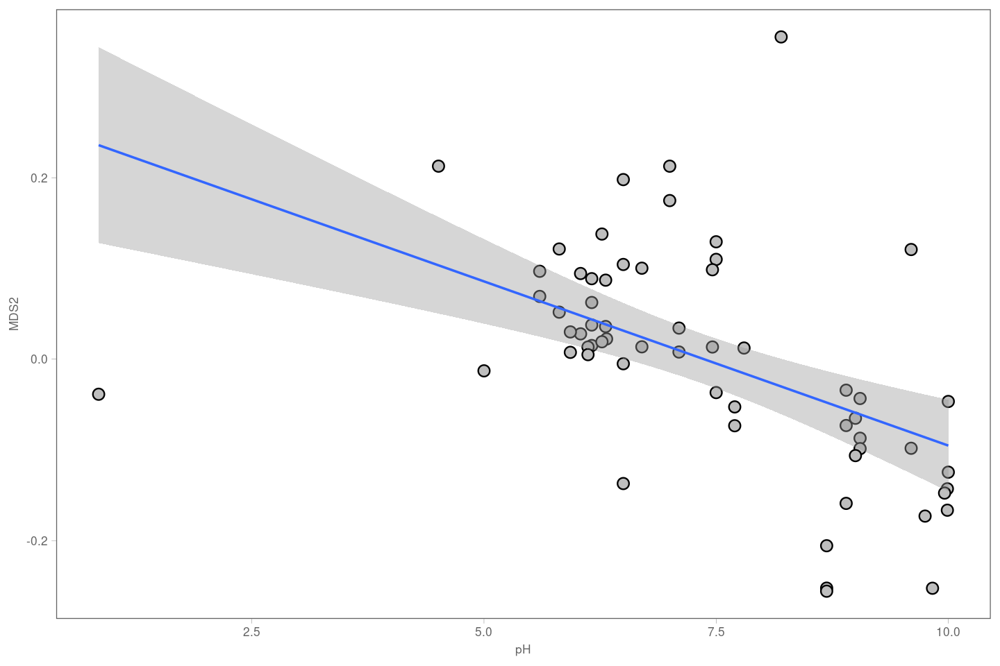

In [119]:
# Fig 4A   - correlation between NMDS axes and variables
# linear model
ggplot(test2,aes(x=pH,y=MDS2)) +
  geom_point(shape = 21, size=4, stroke=1, alpha=1, fill="gray") +
  geom_smooth(method=lm)+
theme_glab(base_size=16)

ggsave("Figure_4A-ph.svg", width=2, height=12)

# Statistical correlation
cor.test(test2$pH, test2$MDS2, method = "pearson")

### ENVFIT analysis

In [120]:
## Create two functions for vector fitting in Vegan
# convert the sample_data() within a phyloseq object to a vegan compatible data object
pssd2veg <- function(physeq) {
  sd <- sample_data(physeq)
  return(as(sd,"data.frame"))
}

# Create an environmental data object only
environmental <- pssd2veg(prok_ndata)

In [121]:
env_geophisic <- environmental[,c(119:132,134:139)]
env_environment <- environmental[,c(38:41,43:45,47:51,56:62,8:10,32:36)]
env_geochemic_major<-environmental[,c(71:80)]
env_geochemic_trace<-environmental[,c(82:88,90:94,96:98,100:105,107:111,114,116:118)]

In [267]:
env_fitting <- envfit(prok_nmds_w_3d, env_environment, perm=9999, na.rm =TRUE, choices=c(2,3))
env_fitting

'nperm' >= set of all permutations: complete enumeration.

Set of permutations < 'minperm'. Generating entire set.

'nperm' >= set of all permutations: complete enumeration.

Set of permutations < 'minperm'. Generating entire set.




***VECTORS

             NMDS2    NMDS3     r2  Pr(>r)  
dic       -0.98980 -0.14244 0.5364 0.45000  
co2       -0.89829  0.43941 0.9934 0.02500 *
he         0.31844 -0.94794 0.7275 0.25000  
n2        -0.02375 -0.99972 0.8572 0.16667  
ch4        0.99918 -0.04046 0.9368 0.08333 .
h2         0.98678  0.16205 0.9743 0.07500 .
o2        -0.80939 -0.58727 0.0764 0.92500  
rc_ra      0.44831 -0.89388 0.9616 0.06667 .
f         -0.60507  0.79617 0.6592 0.33333  
cl        -0.98536 -0.17050 0.6800 0.33333  
so4       -0.87277  0.48813 0.0638 0.90833  
br        -0.92327 -0.38416 0.7583 0.24167  
li        -0.89339  0.44929 0.5216 0.45833  
na        -0.94447  0.32861 0.6753 0.33333  
nh4.1      0.27353 -0.96186 0.1095 0.95000  
k         -0.50916 -0.86067 0.6171 0.38333  
mg         0.12746 -0.99184 0.4891 0.45833  
ca        -0.48497 -0.87453 0.0830 0.91667  
si        -0.69155 -0.72233 0.8881 0.06667 .
latitude   0.44473 -0.89567 0.4575 0.55000  
longitude  0.98700 -0.16071 0.0295 0.99167

In [66]:
summary(env_fitting)

          Length Class     Mode   
vectors    5     vectorfit list   
factors    0     -none-    NULL   
na.action 69     omit      numeric

In [268]:
env_fitting_crust <- envfit(prok_nmds_w_3d, env_geophisic, perm=999, na.rm =TRUE, choices=c(1,3))
env_fitting_crust


***VECTORS

              NMDS1    NMDS3     r2 Pr(>r)    
DPM        -0.38872 -0.92136 0.3850  0.001 ***
CT          0.35252  0.93581 0.3455  0.001 ***
SedThic_On -0.19124 -0.98154 0.0115  0.667    
DistCoast  -0.96327  0.26853 0.0373  0.265    
DSub       -0.10618 -0.99435 0.0736  0.065 .  
DMOR        0.41753  0.90866 0.3297  0.001 ***
DOT         0.52753  0.84954 0.2389  0.001 ***
DHS        -0.34206 -0.93968 0.2172  0.003 ** 
DV         -0.75568 -0.65494 0.0348  0.278    
DMUSGS      0.39609  0.91821 0.4123  0.001 ***
DEQ        -0.41186 -0.91125 0.2176  0.002 ** 
HF         -0.78888 -0.61455 0.0552  0.123    
PV         -0.56331 -0.82624 0.1066  0.025 *  
elv         0.85883  0.51227 0.0145  0.614    
DCS        -0.24496 -0.96953 0.2637  0.001 ***
SDepth      0.06704 -0.99775 0.0460  0.205    
SDip        0.30748  0.95156 0.0846  0.037 *  
ConvR       0.20437  0.97889 0.1696  0.001 ***
ConvObl    -0.24096 -0.97053 0.1533  0.003 ** 
ConvAge    -0.41248 -0.91097 0.3849  0.001 ***


In [275]:
env_fitting_maj <- envfit(prok_nmds_w_3d, env_geochemic_major, perm=999, na.rm =TRUE, choices=c(1,3))
env_fitting_maj


***VECTORS

           NMDS1    NMDS3     r2 Pr(>r)   
sio2_d  -0.28935 -0.95722 0.0056  0.826   
tio2_d  -0.93815 -0.34623 0.0193  0.515   
al2o3_d  0.27437  0.96162 0.0807  0.057 . 
FEOt_d   0.86367  0.50405 0.0245  0.456   
mno_d    0.10269  0.99471 0.0052  0.859   
mgo_d    0.68906  0.72470 0.0138  0.630   
cao_d    0.60029  0.79978 0.0396  0.263   
na2o_d  -0.45298 -0.89152 0.1863  0.002 **
k2o_d   -0.72614 -0.68755 0.0746  0.084 . 
p2o5_d  -0.99925 -0.03871 0.0541  0.172   
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1
Permutation: free
Number of permutations: 999

3 observations deleted due to missingness

In [265]:
env_fitting_min <- envfit(prok_nmds_w_3d, env_geochemic_trace, perm=999, na.rm =TRUE, choices=c(1,2))
env_fitting_min


***VECTORS

        NMDS1    NMDS2     r2 Pr(>r)  
cu_d  0.70491  0.70930 0.0618  0.667  
co_d  0.78381  0.62100 0.0790  0.602  
mo_d  0.82472  0.56554 0.0867  0.570  
ni_d -0.61896  0.78542 0.4453  0.029 *
v_d  -0.94336 -0.33177 0.1208  0.440  
zn_d -0.64882 -0.76094 0.0725  0.637  
ba_d -0.90248  0.43073 0.1151  0.453  
ce_d -0.78144  0.62398 0.2354  0.180  
cr_d  0.19926 -0.97995 0.0936  0.478  
dy_d  0.97266 -0.23224 0.2432  0.162  
er_d -0.35206 -0.93598 0.0612  0.698  
eu_d -0.87308 -0.48758 0.0804  0.593  
gd_d -0.55118 -0.83439 0.0317  0.803  
ho_d -0.18934 -0.98191 0.0908  0.563  
la_d -0.48244  0.87593 0.3541  0.080 .
lu_d  0.80468  0.59370 0.0828  0.584  
nb_d -0.01062  0.99994 0.2385  0.186  
nd_d -0.93353  0.35851 0.1756  0.291  
pb_d  0.80573  0.59229 0.0832  0.582  
pr_d -0.00554  0.99998 0.2014  0.243  
rb_d -0.54890  0.83589 0.0984  0.485  
sm_d -0.86978  0.49344 0.1235  0.419  
sr_d  0.03572  0.99936 0.1807  0.293  
ta_d  0.76561  0.64330 0.0775  0.609  
tb_d -0.1425

In [7]:
options(repr.plot.width=8, repr.plot.height=6)

Warning message in geom_point(size = 8, fill = "black", choices = c(1, 3)):
“Ignoring unknown parameters: `choices`”


NULL

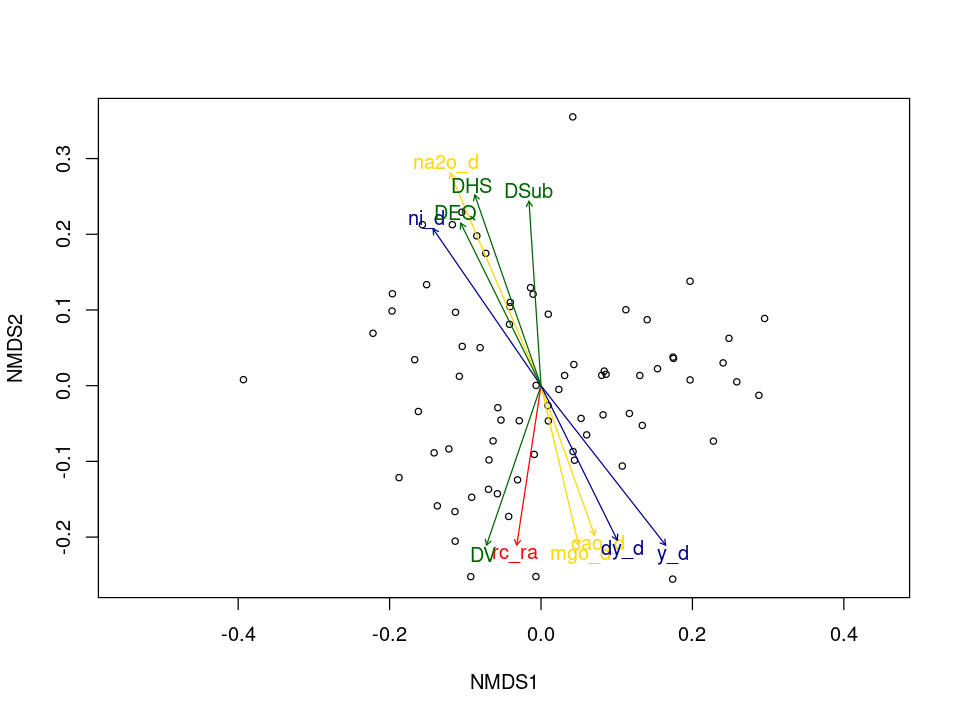

In [8]:
# plot nmds 
plot(prok_nmds_w_3d, display = "sites") +
    geom_point(size=8, fill="black", choices=c(1,3))

# plot envfit
plot(env_fitting, p.max = 0.01, col = "red")
plot(env_fitting_maj, p.max =0.01, col = "gold")
plot(env_fitting_min, p.max = 0.01, col = "darkblue")
plot(env_fitting_crust, p.max = 0.01, col = "darkgreen")

In [ ]:
options(repr.plot.width=12, repr.plot.height=6)

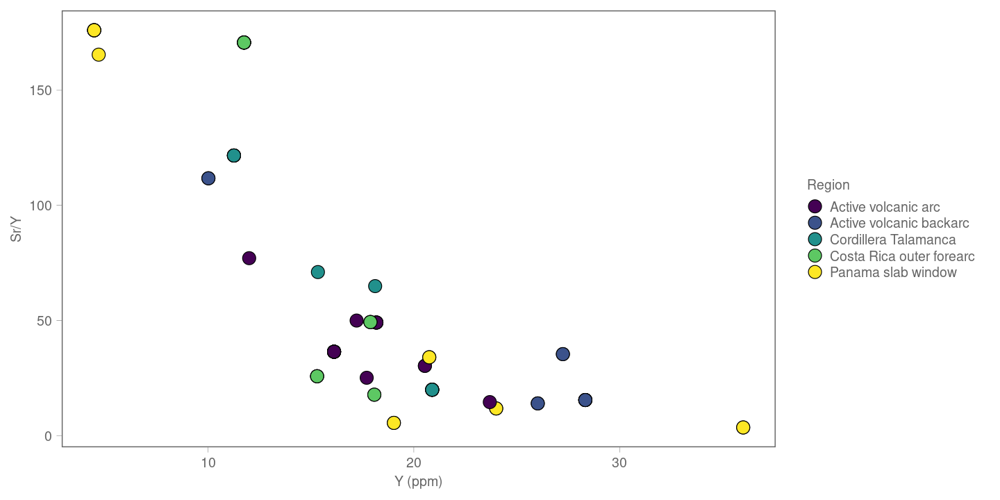

In [95]:
## Figure mantle

ggplot(sample_data(prok_ndata), aes(x=(y_d), y=(sr_d/y_d))) +
  geom_point(aes(fill=location3), shape=21, size=5) +

 guides(fill=guide_legend(override.aes=list(shape=21)))+

  scale_fill_viridis(discrete = TRUE)+
  labs(fill = "Region",
          x="Y (ppm)",
        y="Sr/Y")+
theme_glab(base_size=18)

#ggsave("Figure_4C-nMDS cations.svg", width=12, height=8)

Warning message:
“Removed 12 rows containing missing values (`geom_point()`).”


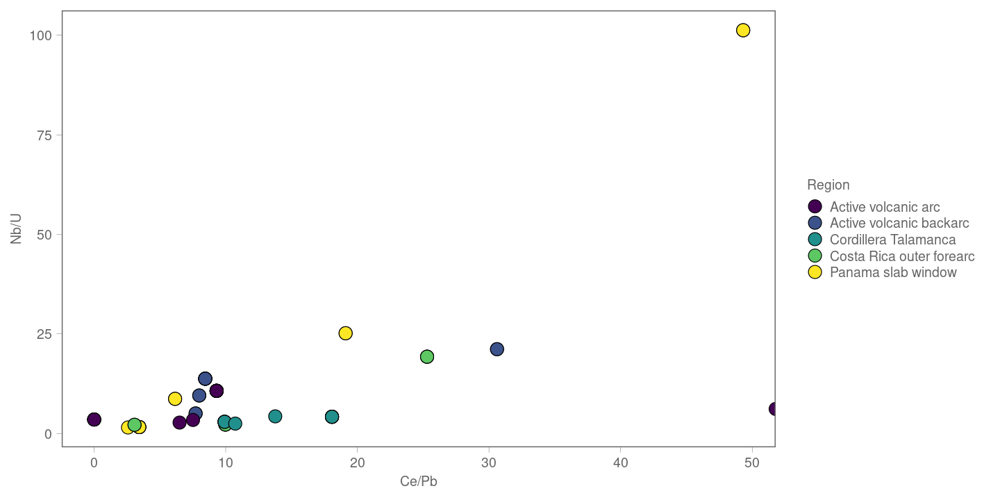

In [96]:
ggplot(sample_data(prok_ndata), aes(x=(ce_d/pb_d), y=(nb_d/u_d))) +
  geom_point(aes(fill=location3), shape=21, size=5) +

 guides(fill=guide_legend(override.aes=list(shape=21)))+

  scale_fill_viridis(discrete = TRUE)+
  labs(fill = "Region",
          x="Ce/Pb",
        y="Nb/U")+
theme_glab(base_size=18)

Warning message:
“Removed 11 rows containing missing values (`geom_point()`).”


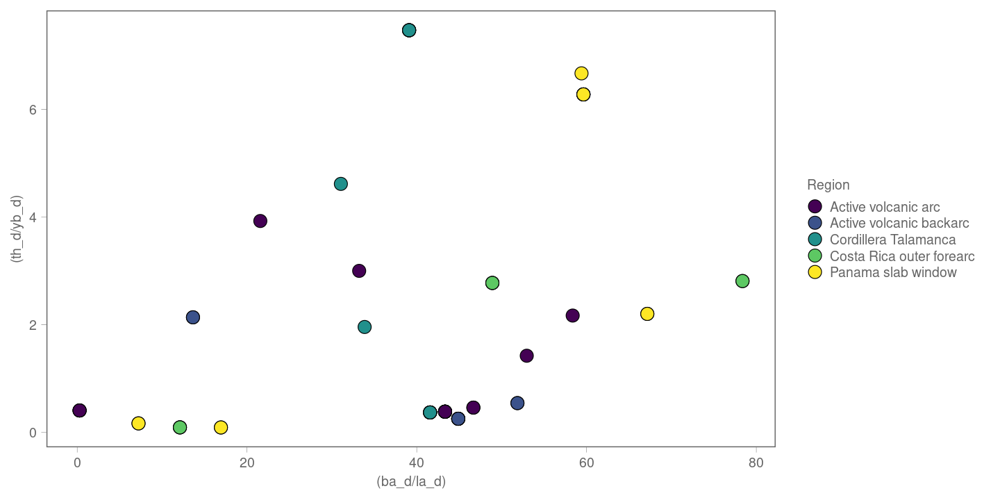

In [111]:
ggplot(sample_data(prok_ndata), aes(y=(th_d/yb_d), x=(ba_d/la_d))) +
  geom_point(aes(fill=location3), shape=21, size=5) +

 guides(fill=guide_legend(override.aes=list(shape=21)))+

  scale_fill_viridis(discrete = TRUE)+
  labs(fill = "Region")+
theme_glab(base_size=18)

Warning message:
“Removed 7 rows containing missing values (`geom_point()`).”


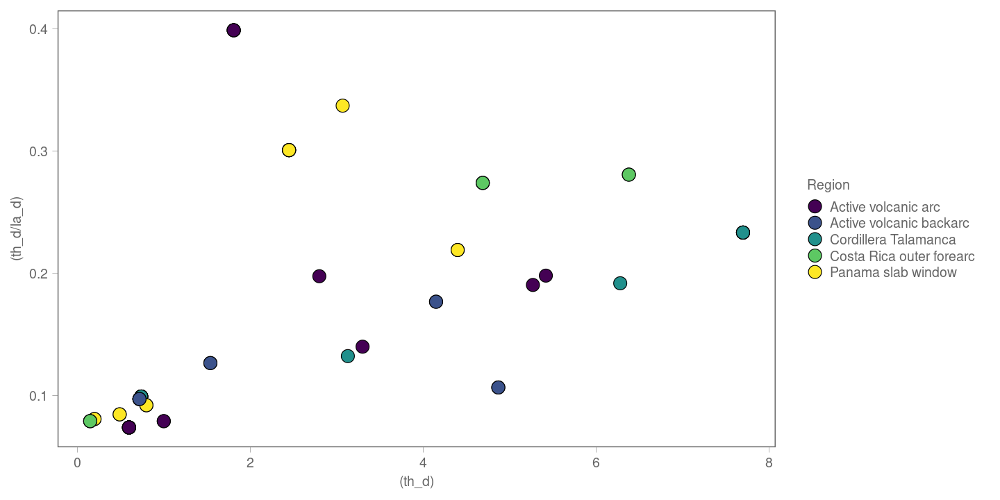

In [90]:
ggplot(sample_data(prok_ndata), aes(x=(th_d), y=(th_d/la_d))) +
  geom_point(aes(fill=location3), shape=21, size=5) +

 guides(fill=guide_legend(override.aes=list(shape=21)))+

  scale_fill_viridis(discrete = TRUE)+
  labs(fill = "Region")+
theme_glab(base_size=18)

In [154]:
## Testing for dispersion
# Mantel test

geo = data.frame(sample_norm$longitude, sample_norm$latitude)

#geographic data frame - haversine distance 
d.geo = distm(geo, fun = distHaversine)
dist.geo = as.dist(d.geo)

In [59]:
dist.geo

              1            2            3            4            5
2  650437.17142                                                    
3  650437.17142      0.00000                                       
4  650437.17142      0.00000      0.00000                          
5  650437.17142      0.00000      0.00000      0.00000             
6  281894.03312 410540.51377 410540.51377 410540.51377 410540.51377
7  281894.03312 410540.51377 410540.51377 410540.51377 410540.51377
8  281850.97065 410621.42101 410621.42101 410621.42101 410621.42101
9   53801.92613 606275.75251 606275.75251 606275.75251 606275.75251
10  53801.92613 606275.75251 606275.75251 606275.75251 606275.75251
11 262448.02440 551565.81835 551565.81835 551565.81835 551565.81835
12 262448.02440 551565.81835 551565.81835 551565.81835 551565.81835
13 120101.63247 568862.72882 568862.72882 568862.72882 568862.72882
14 120101.63247 568862.72882 568862.72882 568862.72882 568862.72882
15  43991.42073 624931.13263 624931.13263 624931

In [164]:
# using NMDS Distance ps_j_w
#abundance vs geographic 
abund_geo  = mantel(ps_j_w, dist.geo, method = "pearson", permutations = 999, na.rm = TRUE)
abund_geo


Mantel statistic based on Pearson's product-moment correlation 

Call:
mantel(xdis = ps_j_w, ydis = dist.geo, method = "pearson", permutations = 999,      na.rm = TRUE) 

Mantel statistic r: 0.141 
      Significance: 0.001 

Upper quantiles of permutations (null model):
   90%    95%  97.5%    99% 
0.0371 0.0503 0.0619 0.0714 
Permutation: free
Number of permutations: 999


In [64]:
length(ps_j_w)

[1] 2701

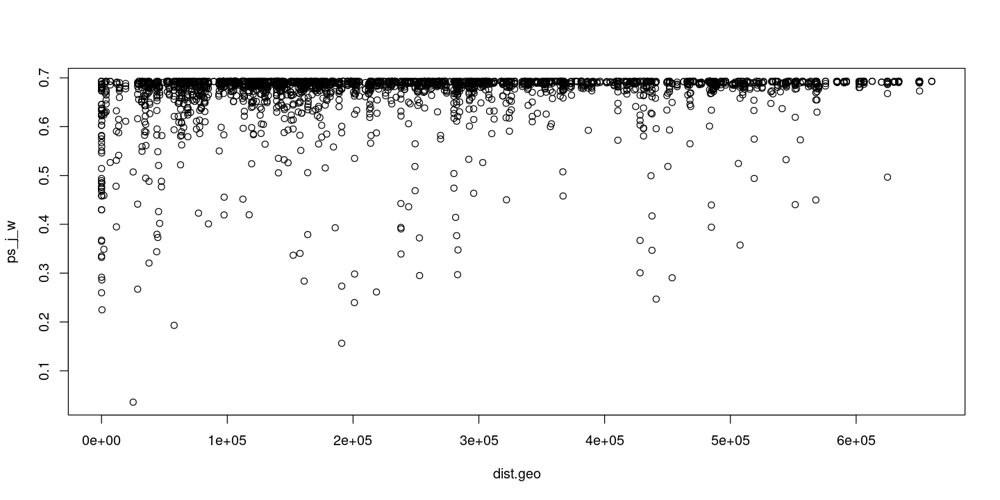

In [65]:
plot(dist.geo, ps_j_w)

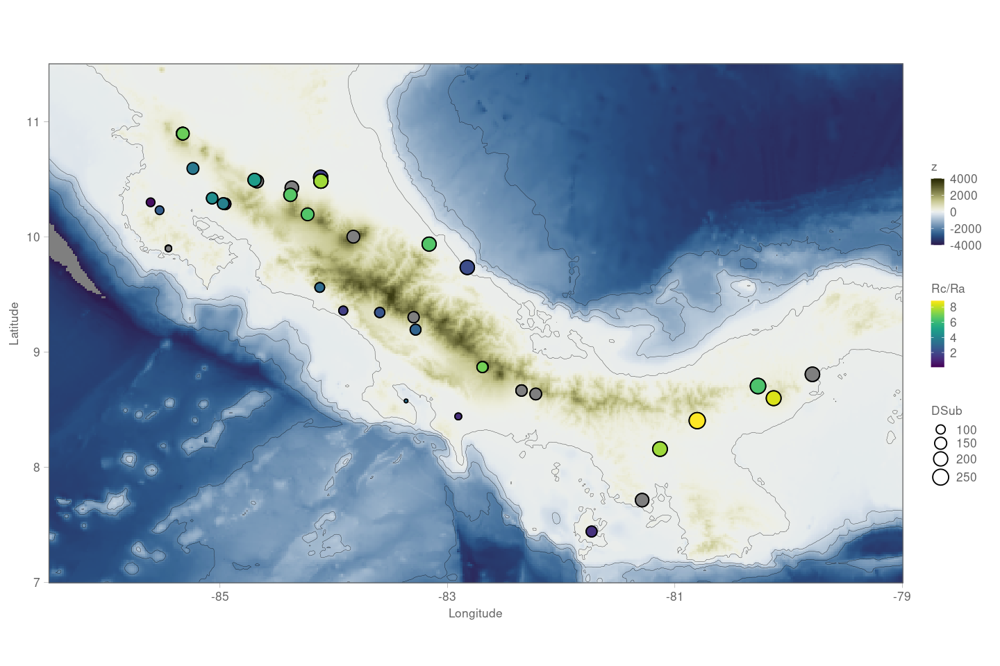

In [183]:
## Supplementary Figure S1A - Map
ggplot(bat, aes(x=x, y=y)) +
  coord_quickmap() +
  geom_raster(aes(fill=z)) +
  scale_fill_scico(palette = "broc", limits = c(-4000, 4000)) +

  geom_contour(aes(z=z),
               breaks=c(0, -500, -1000, -2000, -10000), colour="grey3", size=0.1) +
  scale_x_continuous(expand=c(0,0)) +
  scale_y_continuous(expand=c(0,0)) +

  new_scale_fill() +
  geom_point(data = sample_data(prok_ndata), aes(y=latitude, x=longitude, fill =rc_ra, size = DSub), stroke = 0.8, shape = 21) +
  guides(color = guide_legend(override.aes = list(size = 6))) +
  scale_fill_viridis(discrete=F) +

  labs(title = "",
       fill = "Rc/Ra",
       x = "Longitude",
       y = "Latitude",
       z="Elevation (m)") +

theme_glab(base_size = 16)

 ggsave("Supplementary Figure_S1A - map.svg", width = 10, height = 6)

Warning message:
“Removed 12 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 12 rows containing missing values (`geom_point()`).”



	Pearson's product-moment correlation

data:  coord$rc_ra and coord$DSub
t = 4.5658, df = 34, p-value = 6.233e-05
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.3611259 0.7858750
sample estimates:
      cor 
0.6165164 


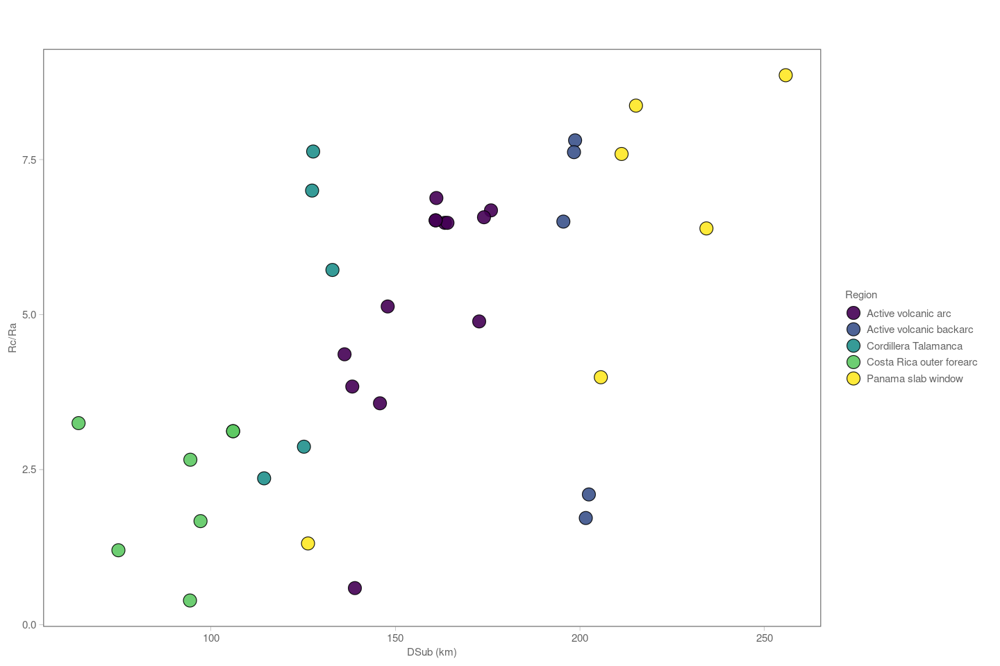

In [185]:
## Supplementary Figure S1B
ggplot(coord, aes(DSub, rc_ra, fill=location3))+
  geom_point(shape = 21, size = 5, alpha = 0.9)+
  scale_fill_viridis(discrete=T)+
  scale_size_continuous(range = c(0.1, 15))+
  scale_shape_manual(values=c(21,22,23,24,25)) +

labs(title="",
     subtitle="",
     fill="Region",
     y="Rc/Ra",
     x="DSub (km)") +

   theme_glab(base_size = 14)

ggsave("Figure_S1B - Helium.svg", width=6, height=6)

cor.test(coord$rc_ra, coord$DSub, method = "pearson")

Warning message:
“Removed 6 rows containing non-finite values (`stat_boxplot()`).”
Warning message:
“Removed 6 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 6 rows containing non-finite values (`stat_boxplot()`).”
Warning message:
“Removed 6 rows containing missing values (`geom_point()`).”


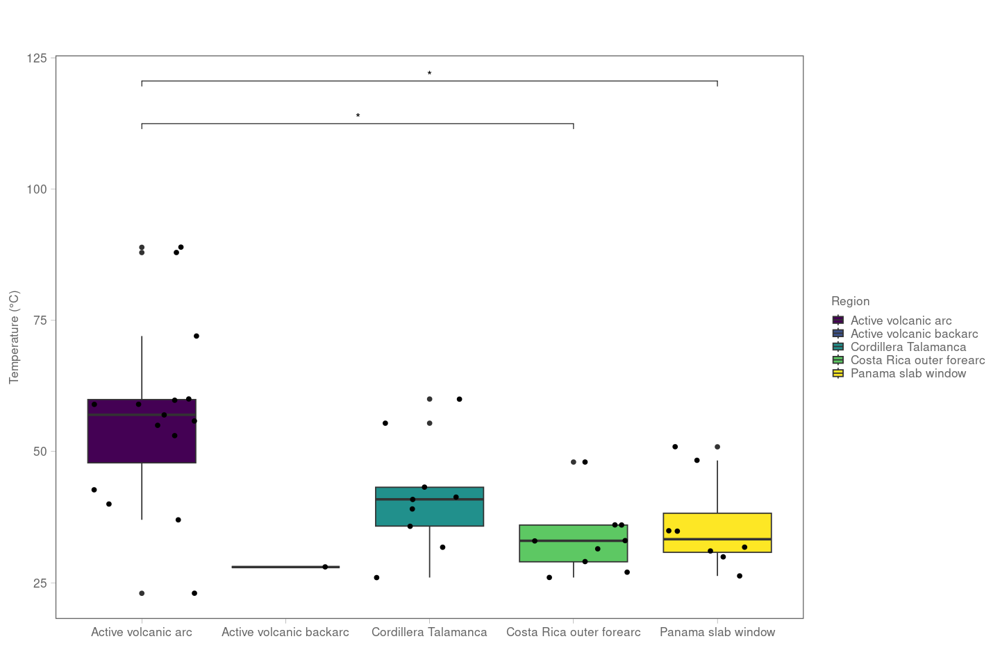

In [198]:
## Supplementary Figure 2A - Temp

p_cor <- ggplot(coord, aes(location3,Temp))+
	geom_boxplot(aes(fill=location3))+
    geom_jitter() +
	scale_fill_viridis(discrete=TRUE) +
	theme(axis.text.x = element_text(angle = 45, hjust=1))+

labs(title="",
     subtitle="",
     fill="Region",
     y="Temperature (°C)",
     x="") +

theme(legend.position = "none")+
   theme_glab(base_size = 16)

# ggsave('box1.svg', width = 6, height= 4)
df_p_val <- rstatix::wilcox_test(coord,Temp ~ location3) %>% 
	rstatix::add_xy_position()
p_cor <-p_cor + stat_pvalue_manual(df_p_val, label = "p.adj.signif", tip.length = 0.01, hide.ns = TRUE)

p_cor

ggsave("Figure_S2A - Temp.svg", width=10, height=4)

Warning message:
“Removed 8 rows containing non-finite values (`stat_boxplot()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing non-finite values (`stat_boxplot()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”


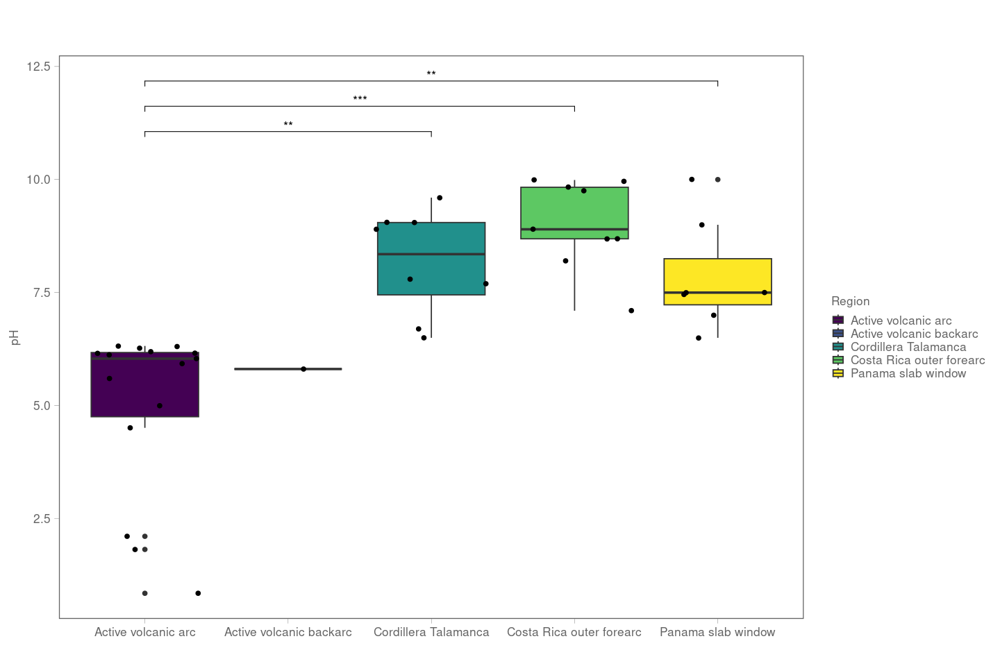

In [199]:
## Supplementary Figure 2B - pH

p_cor <- ggplot(coord, aes(location3,pH))+
	geom_boxplot(aes(fill=location3))+
    geom_jitter() +
	scale_fill_viridis(discrete=TRUE) +
	theme(axis.text.x = element_text(angle = 45, hjust=1))+

labs(title="",
     subtitle="",
     fill="Region",
     y="pH",
     x="") +

theme(legend.position = "none")+
   theme_glab(base_size = 16)

# ggsave('box1.svg', width = 6, height= 4)
df_p_val <- rstatix::wilcox_test(coord,pH ~ location3) %>% 
	rstatix::add_xy_position()
p_cor <-p_cor + stat_pvalue_manual(df_p_val, label = "p.adj.signif", tip.length = 0.01, hide.ns = TRUE)

p_cor

ggsave("Figure_S2B - pH.svg", width=10, height=4)

Warning message:
“Removed 11 rows containing non-finite values (`stat_boxplot()`).”
Warning message:
“Removed 11 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 11 rows containing non-finite values (`stat_boxplot()`).”
Warning message:
“Removed 11 rows containing missing values (`geom_point()`).”


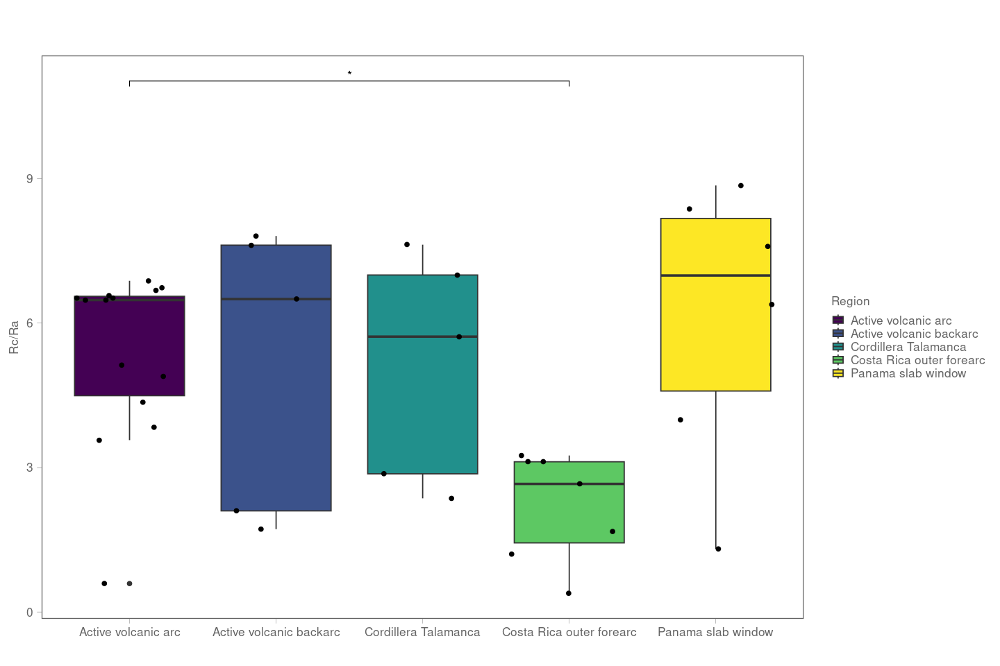

In [200]:
## Supplementary Figure 2C - Rc/Ra

p_cor <- ggplot(coord, aes(location3,rc_ra))+
	geom_boxplot(aes(fill=location3))+
    geom_jitter() +
	scale_fill_viridis(discrete=TRUE) +
	theme(axis.text.x = element_text(angle = 45, hjust=1))+

labs(title="",
     subtitle="",
     fill="Region",
     y="Rc/Ra",
     x="") +

theme(legend.position = "none")+
   theme_glab(base_size = 16)

# ggsave('box1.svg', width = 6, height= 4)
df_p_val <- rstatix::wilcox_test(coord,rc_ra ~ location3) %>% 
	rstatix::add_xy_position()
p_cor <-p_cor + stat_pvalue_manual(df_p_val, label = "p.adj.signif", tip.length = 0.01, hide.ns = TRUE)

p_cor

ggsave("Figure_S2C - rc_ra.svg", width=10, height=4)

In [ ]:
## Supplementary Figure S3 - Correlogram





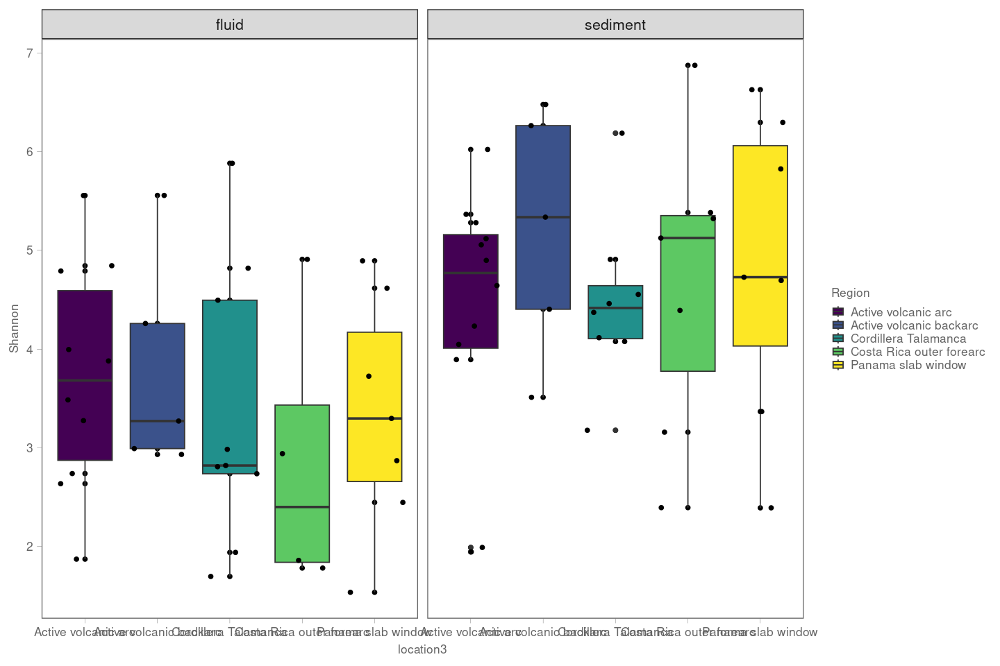

In [218]:
## Supplementary Figure S4 - Shannon diversity

p_richness <- plot_richness(prok_data, x = "location3" , measures =c("Shannon")) +
   geom_boxplot(aes(fill=location3)) +
    geom_jitter() +
   facet_wrap(~sample_type) +
    scale_fill_viridis(discrete=TRUE)+
   labs(y="Shannon",
      fill="Region") +
   theme_glab(base_size=16)

p_richness

ggsave("Figure_S4 - Diversity.svg", width=10, height=6)
ggsave("Figure_S4 - Diversity.jpg", width=10, height=6)

In [223]:
## Test diversity effects between Region, sample type and rock type

shannon <- microbiome::alpha(prok_data, index = 'shannon' )
sample_alpha <- meta(prok_data)
sample_alpha$shannon <- shannon$diversity_shannon

Observed richness

Other forms of richness

Diversity

Evenness

Dominance

Rarity



In [225]:
# ANOVA test
res.aov <- aov(shannon~sample_type*location3*TAS, data = sample_alpha)
res.aov
summary(res.aov)

Call:
   aov(formula = shannon ~ sample_type * location3 * TAS, data = sample_alpha)

Terms:
                sample_type location3      TAS sample_type:location3
Sum of Squares     25.59585   2.80822 11.23269               1.34954
Deg. of Freedom           1         4        4                     4
                sample_type:TAS location3:TAS sample_type:location3:TAS
Sum of Squares          3.92417      16.06323                   9.83861
Deg. of Freedom               4             5                         3
                Residuals
Sum of Squares   64.97275
Deg. of Freedom        48

Residual standard error: 1.163443
24 out of 50 effects not estimable
Estimated effects may be unbalanced

                          Df Sum Sq Mean Sq F value   Pr(>F)    
sample_type                1  25.60  25.596  18.909 7.11e-05 ***
location3                  4   2.81   0.702   0.519   0.7224    
TAS                        4  11.23   2.808   2.075   0.0988 .  
sample_type:location3      4   1.35   0.337   0.249   0.9087    
sample_type:TAS            4   3.92   0.981   0.725   0.5794    
location3:TAS              5  16.06   3.213   2.373   0.0529 .  
sample_type:location3:TAS  3   9.84   3.280   2.423   0.0773 .  
Residuals                 48  64.97   1.354                     
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

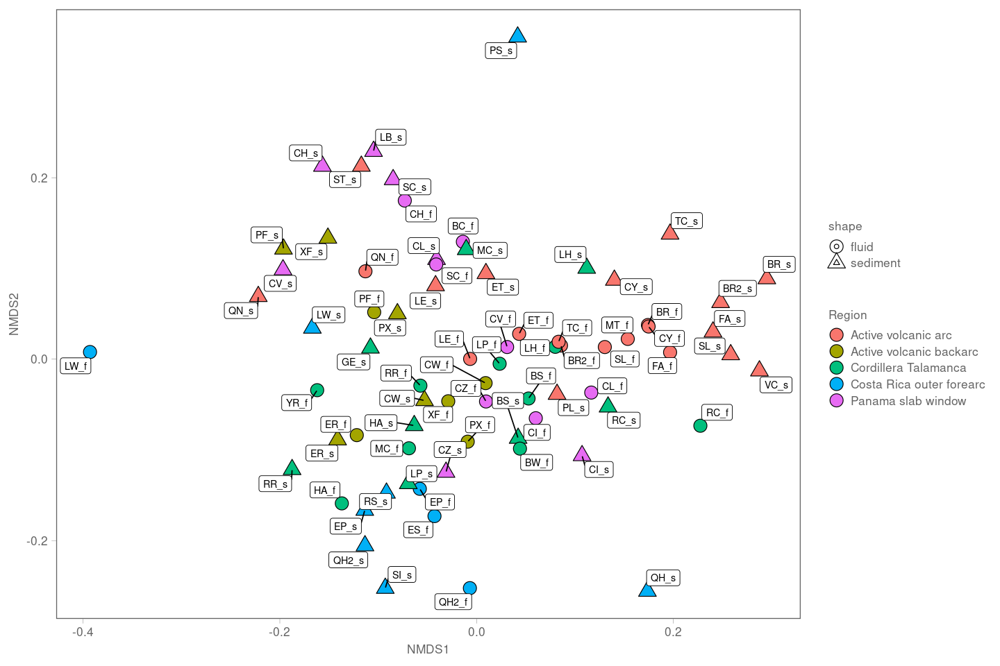

In [207]:
## Supplementary Fig. S5 - nmds with labels

plot_ordination(prok_ndata, prok_nmds_w_3d, type = "sample") +
  geom_point(aes(fill=location3, shape=sample_type), size=5) +
  geom_label_repel(aes(label = code), size = 3, color = "black", force = 5, max.overlaps = 30)+
  scale_shape_manual(values = c(21,24))+
 guides(fill=guide_legend(override.aes=list(shape=21)))+
  labs(fill = "Region")+
  theme_glab(base_size = 16) 

ggsave("Figure_S5 - NMDs_names.svg", width=10, height=6)
ggsave("Figure_S5 - NMDs_names.jpg", width=10, height=6)

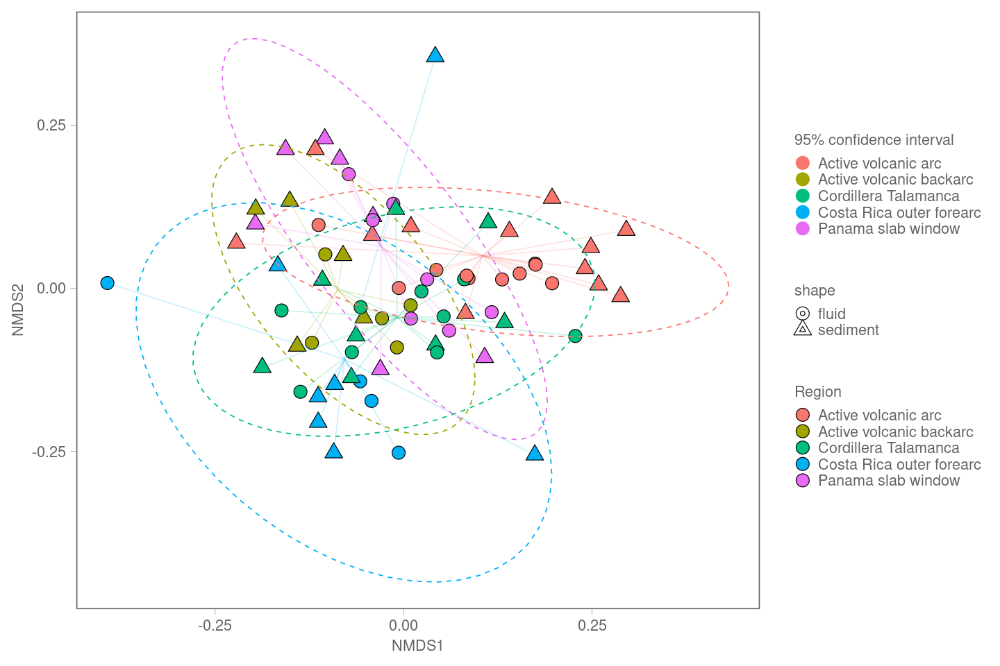

In [206]:
## Supplementary Fig. S6 - nmds with ellipses
plot_ordination(prok_ndata, prok_nmds_w_3d, type = "sample") +
  geom_point(aes(fill=location3, shape=sample_type), size=5) +
  scale_shape_manual(values = c(21,24))+
  stat_ellipse(aes(color=location3), type="t", linetype=2 , show.legend=FALSE, level=0.95) +
  stat_stars(aes(color=location3), geom="segment", show.legend=FALSE, alpha=0.2)+
 guides(fill=guide_legend(override.aes=list(shape=21)))+
  labs(fill = "Region",
       color = "95% confidence interval")+
  theme_glab(base_size = 20) 


ggsave("Figure_S6 - NMDs ellipses all.svg", width=10, height=6)
ggsave("Figure_S6 - NMDs ellipses all.jpg", width=10, height=6)

In [226]:
save.image()